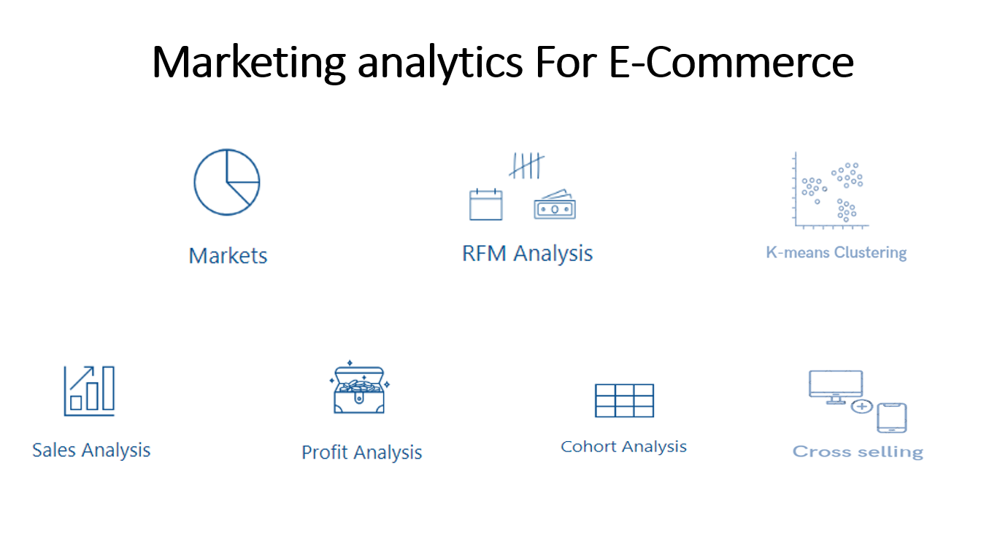# 

#
importing libraries and loading Dataset 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn import metrics
import plotly.express as px
import plotly as py
import colorama
from colorama import Fore, Style  # makes strings colored
from termcolor import colored
from termcolor import cprint
import scipy.stats as stats
import datetime
import datetime as dt
%matplotlib inline
import statsmodels.api as sm
import statsmodels.formula.api as smf
import plotly.graph_objects as go

# Scaling
from sklearn.preprocessing import scale 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PowerTransformer 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler
# Modelling
from sklearn.cluster import KMeans
from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN,SpectralClustering
#from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics import silhouette_samples,silhouette_score

import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
from matplotlib.colors import ListedColormap
from matplotlib import colors
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")
from plotly import __version__
%matplotlib inline
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

In [2]:
e = pd.read_csv("DataCoSupplyChainDataset.csv" ,encoding='ISO-8859-1')

# Data preparation 

# 
Exploratory data analysis (EDA)

In [3]:
e

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/15/2018 11:24,Standard Class
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,CASH,4,4,40.000000,399.980011,Shipping on time,0,45,Fishing,Brooklyn,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/20/2016 3:40,Standard Class
180515,DEBIT,3,2,-613.770019,395.980011,Late delivery,1,45,Fishing,Bakersfield,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/19/2016 1:34,Second Class
180516,TRANSFER,5,4,141.110001,391.980011,Late delivery,1,45,Fishing,Bristol,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/20/2016 21:00,Standard Class
180517,PAYMENT,3,4,186.229996,387.980011,Advance shipping,0,45,Fishing,Caguas,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/18/2016 20:18,Standard Class


In [4]:
e['Order Status'].str.startswith('CANCELED').value_counts()

False    176827
True       3692
Name: Order Status, dtype: int64

In [5]:
df = e[["Customer Id" ,"Customer City","Customer Country", "Order Id" ,"Category Name","Product Name","order date (DateOrders)","Order Item Quantity","Order Item Product Price","Order Item Discount","Order Item Total" , "Order Status" , "Order Country" ,"Latitude","Longitude","Order City"]]
df

,Customer Id,Customer City,Customer Country,Order Id,Category Name,Product Name,order date (DateOrders),Order Item Quantity,Order Item Product Price,Order Item Discount,Order Item Total,Order Status,Order Country,Latitude,Longitude,Order City
0,20755,Caguas,Puerto Rico,77202,Sporting Goods,Smart watch,1/31/2018 22:56,1,327.750000,13.110000,314.640015,COMPLETE,Indonesia,18.251453,-66.037056,Bekasi
1,19492,Caguas,Puerto Rico,75939,Sporting Goods,Smart watch,1/13/2018 12:27,1,327.750000,16.389999,311.359985,PENDING,India,18.279451,-66.037064,Bikaner
2,19491,San Jose,EE. UU.,75938,Sporting Goods,Smart watch,1/13/2018 12:06,1,327.750000,18.030001,309.720001,CLOSED,India,37.292233,-121.881279,Bikaner
3,19490,Los Angeles,EE. UU.,75937,Sporting Goods,Smart watch,1/13/2018 11:45,1,327.750000,22.940001,304.809998,COMPLETE,Australia,34.125946,-118.291016,Townsville
4,19489,Caguas,Puerto Rico,75936,Sporting Goods,Smart watch,1/13/2018 11:24,1,327.750000,29.500000,298.250000,PENDING_PAYMENT,Australia,18.253769,-66.037048,Townsville
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,1005,Brooklyn,EE. UU.,26043,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1/16/2016 3:40,1,399.980011,0.000000,399.980011,CLOSED,China,40.640930,-73.942711,Shanghái
180515,9141,Bakersfield,EE. UU.,26037,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1/16/2016 1:34,1,399.980011,4.000000,395.980011,COMPLETE,Japón,35.362545,-119.018700,Hirakata
180516,291,Bristol,EE. UU.,26024,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1/15/2016 21:00,1,399.980011,8.000000,391.980011,PENDING,Australia,41.629959,-72.967155,Adelaide
180517,2813,Caguas,Puerto Rico,26022,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1/15/2016 20:18,1,399.980011,12.000000,387.980011,PENDING_PAYMENT,Australia,18.213350,-66.370575,Adelaide


In [6]:
df.rename(columns = {"Customer Id":"CustomerID" ,"Customer City":"Customer_City","Customer Country":"Customer_Country", "Order Id":"OrderID" ,"Category Name":"Category_Name","Product Name":"Product_Name","order date (DateOrders)":"Order_date","Order Item Quantity":"Order_Quantity","Order Item Product Price":"Product_Price","Order Item Discount":"Order_Discount","Order Item Total":"Total_price" , "Order Status":"Order_Status" , "Order Country":"Order_Country","Order City":"Order City"}, inplace=True)
df

,CustomerID,Customer_City,Customer_Country,OrderID,Category_Name,Product_Name,Order_date,Order_Quantity,Product_Price,Order_Discount,Total_price,Order_Status,Order_Country,Latitude,Longitude,Order City
0,20755,Caguas,Puerto Rico,77202,Sporting Goods,Smart watch,1/31/2018 22:56,1,327.750000,13.110000,314.640015,COMPLETE,Indonesia,18.251453,-66.037056,Bekasi
1,19492,Caguas,Puerto Rico,75939,Sporting Goods,Smart watch,1/13/2018 12:27,1,327.750000,16.389999,311.359985,PENDING,India,18.279451,-66.037064,Bikaner
2,19491,San Jose,EE. UU.,75938,Sporting Goods,Smart watch,1/13/2018 12:06,1,327.750000,18.030001,309.720001,CLOSED,India,37.292233,-121.881279,Bikaner
3,19490,Los Angeles,EE. UU.,75937,Sporting Goods,Smart watch,1/13/2018 11:45,1,327.750000,22.940001,304.809998,COMPLETE,Australia,34.125946,-118.291016,Townsville
4,19489,Caguas,Puerto Rico,75936,Sporting Goods,Smart watch,1/13/2018 11:24,1,327.750000,29.500000,298.250000,PENDING_PAYMENT,Australia,18.253769,-66.037048,Townsville
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,1005,Brooklyn,EE. UU.,26043,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1/16/2016 3:40,1,399.980011,0.000000,399.980011,CLOSED,China,40.640930,-73.942711,Shanghái
180515,9141,Bakersfield,EE. UU.,26037,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1/16/2016 1:34,1,399.980011,4.000000,395.980011,COMPLETE,Japón,35.362545,-119.018700,Hirakata
180516,291,Bristol,EE. UU.,26024,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1/15/2016 21:00,1,399.980011,8.000000,391.980011,PENDING,Australia,41.629959,-72.967155,Adelaide
180517,2813,Caguas,Puerto Rico,26022,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1/15/2016 20:18,1,399.980011,12.000000,387.980011,PENDING_PAYMENT,Australia,18.213350,-66.370575,Adelaide


In [7]:
df.info(verbose = True, null_counts = False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 16 columns):
 #   Column            Dtype  
---  ------            -----  
 0   CustomerID        int64  
 1   Customer_City     object 
 2   Customer_Country  object 
 3   OrderID           int64  
 4   Category_Name     object 
 5   Product_Name      object 
 6   Order_date        object 
 7   Order_Quantity    int64  
 8   Product_Price     float64
 9   Order_Discount    float64
 10  Total_price       float64
 11  Order_Status      object 
 12  Order_Country     object 
 13  Latitude          float64
 14  Longitude         float64
 15  Order City        object 
dtypes: float64(5), int64(3), object(8)
memory usage: 22.0+ MB


In [8]:
df["Order_date"] = pd.to_datetime(df["Order_date"])

In [9]:

df["Order_date"].min()

Timestamp('2015-01-01 00:00:00')

In [10]:
df["Order_date"].max()

Timestamp('2018-01-31 23:38:00')

In [11]:
df = df[(df["Order_date"] >= '2017-01-31 0:09') & (df["Order_date"] <= '2018-01-31 23:38:00')]

In [12]:
df["Order_date"].max()


Timestamp('2018-01-31 23:38:00')

In [13]:
df["Order_date"].min()

Timestamp('2017-01-31 00:09:00')

In [14]:
df= df[df["Order_Status"]!= "CANCELED"]

In [15]:
df.info(verbose = True, null_counts = False)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49211 entries, 0 to 179629
Data columns (total 16 columns):
 #   Column            Dtype         
---  ------            -----         
 0   CustomerID        int64         
 1   Customer_City     object        
 2   Customer_Country  object        
 3   OrderID           int64         
 4   Category_Name     object        
 5   Product_Name      object        
 6   Order_date        datetime64[ns]
 7   Order_Quantity    int64         
 8   Product_Price     float64       
 9   Order_Discount    float64       
 10  Total_price       float64       
 11  Order_Status      object        
 12  Order_Country     object        
 13  Latitude          float64       
 14  Longitude         float64       
 15  Order City        object        
dtypes: datetime64[ns](1), float64(5), int64(3), object(7)
memory usage: 6.4+ MB


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49211 entries, 0 to 179629
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   CustomerID        49211 non-null  int64         
 1   Customer_City     49211 non-null  object        
 2   Customer_Country  49211 non-null  object        
 3   OrderID           49211 non-null  int64         
 4   Category_Name     49211 non-null  object        
 5   Product_Name      49211 non-null  object        
 6   Order_date        49211 non-null  datetime64[ns]
 7   Order_Quantity    49211 non-null  int64         
 8   Product_Price     49211 non-null  float64       
 9   Order_Discount    49211 non-null  float64       
 10  Total_price       49211 non-null  float64       
 11  Order_Status      49211 non-null  object        
 12  Order_Country     49211 non-null  object        
 13  Latitude          49211 non-null  float64       
 14  Longitude         492

In [17]:
df.duplicated().sum()


0

In [18]:
#df["totalprice"]=df["Order Item Product Price"] * df["Order Item Quantity"]
#df.profile_report()
#
#Pandas profiling is an open source Python module with which we can quickly do an exploratory data analysis with just a few lines of code. Similarly, for EDA, profile_report() is One-Line Magical Code creating reports in the interactive HTML format which is quite easy to understand and analyze the data. In short, at the first hand, what pandas profiling does is to save us all the work of visualizing and understanding the distribution of each variable.
df

,CustomerID,Customer_City,Customer_Country,OrderID,Category_Name,Product_Name,Order_date,Order_Quantity,Product_Price,Order_Discount,Total_price,Order_Status,Order_Country,Latitude,Longitude,Order City
0,20755,Caguas,Puerto Rico,77202,Sporting Goods,Smart watch,2018-01-31 22:56:00,1,327.750000,13.110000,314.640015,COMPLETE,Indonesia,18.251453,-66.037056,Bekasi
1,19492,Caguas,Puerto Rico,75939,Sporting Goods,Smart watch,2018-01-13 12:27:00,1,327.750000,16.389999,311.359985,PENDING,India,18.279451,-66.037064,Bikaner
2,19491,San Jose,EE. UU.,75938,Sporting Goods,Smart watch,2018-01-13 12:06:00,1,327.750000,18.030001,309.720001,CLOSED,India,37.292233,-121.881279,Bikaner
3,19490,Los Angeles,EE. UU.,75937,Sporting Goods,Smart watch,2018-01-13 11:45:00,1,327.750000,22.940001,304.809998,COMPLETE,Australia,34.125946,-118.291016,Townsville
4,19489,Caguas,Puerto Rico,75936,Sporting Goods,Smart watch,2018-01-13 11:24:00,1,327.750000,29.500000,298.250000,PENDING_PAYMENT,Australia,18.253769,-66.037048,Townsville
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179624,9204,Caguas,Puerto Rico,60127,Cleats,Perfect Fitness Perfect Rip Deck,2017-05-27 16:48:00,5,59.990002,44.990002,254.960007,PENDING,Brasil,18.284536,-66.370605,Maceió
179626,10240,Caguas,Puerto Rico,58682,Cleats,Perfect Fitness Perfect Rip Deck,2017-05-06 14:34:00,5,59.990002,50.990002,248.960007,PENDING,Honduras,18.281187,-66.370613,Choluteca
179627,3,Caguas,Puerto Rico,56178,Cleats,Perfect Fitness Perfect Rip Deck,2017-03-31 01:18:00,5,59.990002,53.990002,245.960007,PENDING,Honduras,18.025375,-66.615082,Tegucigalpa
179628,7024,Caguas,Puerto Rico,59542,Cleats,Perfect Fitness Perfect Rip Deck,2017-05-19 03:51:00,5,59.990002,74.989998,224.960007,PENDING,México,18.229071,-66.370583,Mexico City


In [19]:
df.duplicated().sum()

0

In [20]:
df=df.drop_duplicates()

In [21]:
df.duplicated().sum()



0

In [22]:
df.isnull().sum()

CustomerID          0
Customer_City       0
Customer_Country    0
OrderID             0
Category_Name       0
Product_Name        0
Order_date          0
Order_Quantity      0
Product_Price       0
Order_Discount      0
Total_price         0
Order_Status        0
Order_Country       0
Latitude            0
Longitude           0
Order City          0
dtype: int64

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49211 entries, 0 to 179629
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   CustomerID        49211 non-null  int64         
 1   Customer_City     49211 non-null  object        
 2   Customer_Country  49211 non-null  object        
 3   OrderID           49211 non-null  int64         
 4   Category_Name     49211 non-null  object        
 5   Product_Name      49211 non-null  object        
 6   Order_date        49211 non-null  datetime64[ns]
 7   Order_Quantity    49211 non-null  int64         
 8   Product_Price     49211 non-null  float64       
 9   Order_Discount    49211 non-null  float64       
 10  Total_price       49211 non-null  float64       
 11  Order_Status      49211 non-null  object        
 12  Order_Country     49211 non-null  object        
 13  Latitude          49211 non-null  float64       
 14  Longitude         492

In [24]:
df.describe().round()

,CustomerID,OrderID,Order_Quantity,Product_Price,Order_Discount,Total_price,Latitude,Longitude
count,49211.0,49211.0,49211.0,49211.0,49211.0,49211.0,49211.0,49211.0
mean,7939.0,62553.0,2.0,167.0,22.0,199.0,30.0,-85.0
std,5159.0,6513.0,1.0,184.0,27.0,158.0,10.0,21.0
min,2.0,52133.0,1.0,10.0,0.0,8.0,-34.0,-158.0
25%,3723.0,57094.0,1.0,50.0,6.0,108.0,18.0,-98.0
50%,7458.0,62150.0,1.0,100.0,15.0,173.0,33.0,-77.0
75%,11165.0,67196.0,3.0,216.0,32.0,264.0,39.0,-66.0
max,20757.0,77204.0,5.0,2000.0,500.0,1940.0,49.0,115.0


In [25]:
df.describe(include='object')

,Customer_City,Customer_Country,Category_Name,Product_Name,Order_Status,Order_Country,Order City
count,49211,49211,49211,49211,49211,49211,49211
unique,562,2,50,118,8,71,2158
top,Caguas,EE. UU.,Cleats,Perfect Fitness Perfect Rip Deck,COMPLETE,México,Santo Domingo
freq,18455,30033,5802,5766,16470,6067,992


In [26]:
e["Customer Id"].nunique()

20652

In [27]:
e["Customer Id"].nunique()

20652

In [28]:
print("Total number of invoices by country :",'blue')

df.groupby('Order_Country')['OrderID'].count().sort_values(ascending=False).head(10)


Total number of invoices by country : blue


Order_Country
México                  6067
Francia                 5963
Alemania                4327
Brasil                  3631
Reino Unido             3239
Italia                  2190
Honduras                1742
España                  1710
El Salvador             1665
República Dominicana    1661
Name: OrderID, dtype: int64

# Data Visualization 

In [29]:
fig = px.histogram(df, 
                   x = "Order_Country", 
                   title = 'The Number of orders by Country', 
                   color= "Order_Country").update_xaxes(categoryorder="total descending")
fig.show()

In [30]:
print("Countries with highst Revenues")
df.groupby("Order_Country")[['Total_price']].sum().sort_values(by="Total_price",ascending=False).round()

Countries with highst Revenues


,Total_price
Order_Country,
Francia,1295606.0
México,1110846.0
Alemania,933748.0
Reino Unido,719237.0
Brasil,662496.0
...,...
Luxemburgo,633.0
Surinam,619.0
Mongolia,315.0


In [31]:
df.groupby("Order_Country")['CustomerID'].nunique().sort_values(ascending=False)

Order_Country
Francia             2356
México              1846
Alemania            1704
Australia           1391
Reino Unido         1338
                    ... 
Guayana Francesa       2
Chipre                 2
Bután                  1
Surinam                1
Mongolia               1
Name: CustomerID, Length: 71, dtype: int64

In [32]:
dfg1 = df.groupby('Order_Country')["CustomerID"].nunique().sort_values(ascending=False)
fig = px.treemap(dfg1, path=[dfg1.index], values='CustomerID', width=950, height=600)
fig.update_layout(title_text='Customers By Countries',
                  title_x=0.5, title_font=dict(size=20)
                  )
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

In [33]:
dfg2 = df.groupby('Order_Country')["OrderID"].nunique().sort_values(ascending=False)
fig = px.treemap(dfg2, path=[dfg1.index], values='OrderID', width=950, height=600)
fig.update_layout(title_text='Customers By Orders',
                  title_x=0.5, title_font=dict(size=20)
                  )
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

In [34]:
dfg3 = df.groupby('Order_Country')["Total_price"].nunique().sort_values(ascending=False)
fig = px.treemap(dfg3, path=[dfg1.index], values='Total_price', width=950, height=600)
fig.update_layout(title_text='Customers By Revenue',
                  title_x=0.5, title_font=dict(size=20)
                  )
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

In [35]:
fig = px.histogram(df, 
                   x = df.groupby('Order_Country')['OrderID'].nunique().index,
                   y = df.groupby('Order_Country')['OrderID'].nunique().values, 
                   title = 'The Unique Number of orders by Country', 
                   labels = dict(x = "Countries", y ="Order")).update_xaxes(categoryorder="total descending")
fig.show();
#frequency distribution 

In [36]:
print("Top Custmers by Orders number and Sales Revenue")
df.groupby(['OrderID', 'CustomerID', 'Order_Country'])['Product_Price'].sum().sort_values(ascending=False).head(10)

Top Custmers by Orders number and Sales Revenue


OrderID  CustomerID  Order_Country
68703    9515        Reino Unido      3089.949993
68724    1148        Francia          2609.930000
68809    5946        Italia           2579.940006
68858    10744       España           2409.959995
68821    2564        Francia          2389.960003
68806    10351       Irlanda          2389.960003
68766    382         Francia          2339.939995
68778    986         Italia           2329.949993
68848    6517        Francia          2299.969993
68722    4258        Reino Unido      2099.989990
Name: Product_Price, dtype: float64

In [37]:
print("Top Custmers in spending")
df.groupby(['CustomerID', 'Order_Country'])['Product_Price'].sum().sort_values(ascending=False).head(10)

Top Custmers in spending


CustomerID  Order_Country
9515        Reino Unido      3089.949993
1148        Francia          2609.930000
5946        Italia           2579.940006
2484        Alemania         2529.830048
10744       España           2409.959995
2564        Francia          2389.960003
10351       Irlanda          2389.960003
382         Francia          2339.939995
986         Italia           2329.949993
6517        Francia          2299.969993
Name: Product_Price, dtype: float64

In [38]:
print("least Custmers in spendings")
df.groupby(['CustomerID', 'Order_Country'])['Product_Price'].sum().sort_values(ascending=True).head(10)

least Custmers in spendings


CustomerID  Order_Country
5571        México            9.99
2902        Panamá            9.99
12848       Reino Unido      11.29
17769       China            11.29
12941       Francia          11.29
12829       Francia          11.29
12828       Francia          11.29
12942       Alemania         11.29
17770       Australia        11.29
12827       Italia           11.29
Name: Product_Price, dtype: float64

In [39]:
print("least Custmers by Orders number and Sales Revenue")
df.groupby(['OrderID', 'CustomerID', 'Order_Country'])['Product_Price'].sum().sort_values(ascending=True).head(10)

least Custmers by Orders number and Sales Revenue


OrderID  CustomerID  Order_Country
52519    5571        México            9.99
57343    2902        Panamá            9.99
74285    17838       China            11.29
69339    12892       Francia          11.29
69340    12893       Francia          11.29
69341    12894       Francia          11.29
74242    17795       Australia        11.29
69342    12895       Francia          11.29
69343    12896       Reino Unido      11.29
74241    17794       Australia        11.29
Name: Product_Price, dtype: float64

In [40]:
print("Top Custmers by Order Quantity")
df.groupby(['OrderID', 'CustomerID', 'Order_Country'])['Order_Quantity'].sum().sort_values(ascending=False).head(10)

Top Custmers by Order Quantity


OrderID  CustomerID  Order_Country
56559    7366        Guatemala        22
53385    11883       Bolivia          22
56414    12202       Panamá           22
64269    8382        Reino Unido      21
62429    4476        Francia          21
64212    6193        España           21
53247    7667        México           21
53806    3578        Nicaragua        20
57459    490         Bolivia          20
57054    4956        Perú             20
Name: Order_Quantity, dtype: int64

In [41]:
print("Top Custmers by Order Quantity")
df.groupby(['CustomerID', 'Order_Country'])['Order_Quantity'].sum().sort_values(ascending=False).head()

Top Custmers by Order Quantity


CustomerID  Order_Country
5301        México           33
9928        México           30
4114        Francia          29
8548        México           28
9975        México           26
Name: Order_Quantity, dtype: int64

In [42]:
print("least Custmers by Order Quantity")
df.groupby(['CustomerID', 'Order_Country'])['Order_Quantity'].sum().sort_values(ascending=True).head(10)

least Custmers by Order Quantity


CustomerID  Order_Country
20757       Australia        1
15098       España           1
15097       España           1
15096       España           1
15095       España           1
15094       Reino Unido      1
15093       Reino Unido      1
6328        Brasil           1
15092       Reino Unido      1
15091       Alemania         1
Name: Order_Quantity, dtype: int64

In [43]:
print("Most selling products")
df.groupby(["OrderID", 'Product_Name'])["Order_Quantity"].sum().sort_values(ascending=False).head(20)

Most selling products


OrderID  Product_Name                        
53585    Nike Men's Dri-FIT Victory Golf Polo    17
57211    Perfect Fitness Perfect Rip Deck        15
64269    Perfect Fitness Perfect Rip Deck        15
57861    Perfect Fitness Perfect Rip Deck        14
64022    O'Brien Men's Neoprene Life Vest        14
57842    Nike Men's Dri-FIT Victory Golf Polo    14
66381    O'Brien Men's Neoprene Life Vest        14
66332    Perfect Fitness Perfect Rip Deck        13
54163    Perfect Fitness Perfect Rip Deck        13
55603    Perfect Fitness Perfect Rip Deck        13
61757    Perfect Fitness Perfect Rip Deck        13
52981    O'Brien Men's Neoprene Life Vest        13
53385    Nike Men's Dri-FIT Victory Golf Polo    13
54134    Nike Men's Dri-FIT Victory Golf Polo    13
62429    Nike Men's Dri-FIT Victory Golf Polo    13
56487    O'Brien Men's Neoprene Life Vest        13
55412    Perfect Fitness Perfect Rip Deck        13
56540    O'Brien Men's Neoprene Life Vest        13
56175    O'Brien M

Most selling Products


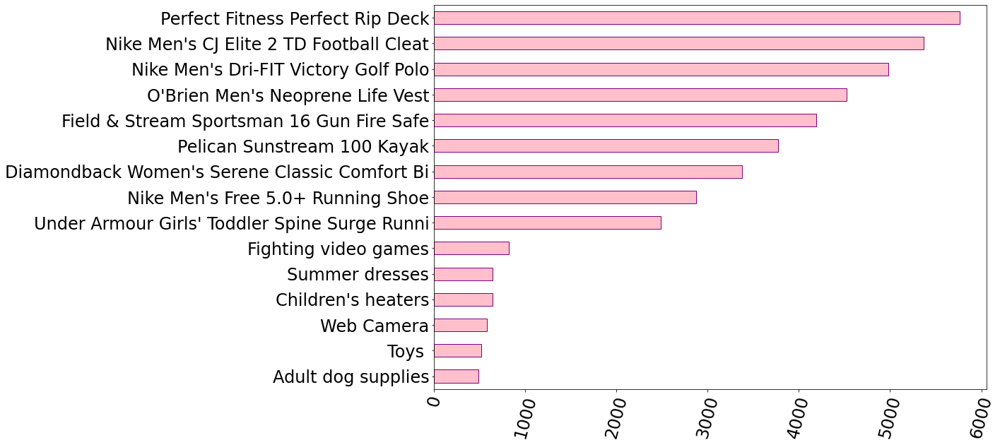

In [44]:
#color='#46ADF5'
print("Most selling Products")
df["Product_Name"].value_counts().head(15).sort_values(ascending=True).plot(kind="barh", width=0.5, color='pink', edgecolor='purple',fontsize=24, figsize=(14, 10))
plt.xticks(rotation=75);

In [45]:
df["Total_price"].min()

8.470000267

In [46]:
df["Total_price"].max()

1939.98999

In [47]:
"""df.rename(columns = {"Customer Id":"CustomerID" ,"Customer City":"Customer_City","Customer Country":"Customer_Country", "Order Id":"OrderID" ,"Category Name":"Category_Name","Product Name":"Product_Name","order date (DateOrders)":"Order_date","Order Item Quantity":"Order_Quantity","Order Item Product Price":"Product_Price","Order Item Discount":"Order_Discount","Order Item Total":"Total_price" , "Order Status":"Order_Status" , "Order Country":"Order_Country","Order City":"Order City"}, inplace=True)
df"""
#df.groupby(['Order Id', 'Order Country'])['Category Name'].sum().sort_values(ascending=False).head(20)
#df.groupby(['Order Id', 'Order Country'])['Product Name'].sum().sort_values(ascending=False).head(20)

'df.rename(columns = {"Customer Id":"CustomerID" ,"Customer City":"Customer_City","Customer Country":"Customer_Country", "Order Id":"OrderID" ,"Category Name":"Category_Name","Product Name":"Product_Name","order date (DateOrders)":"Order_date","Order Item Quantity":"Order_Quantity","Order Item Product Price":"Product_Price","Order Item Discount":"Order_Discount","Order Item Total":"Total_price" , "Order Status":"Order_Status" , "Order Country":"Order_Country","Order City":"Order City"}, inplace=True)\ndf'

In [48]:
#tdate = dt.datetime(2018,2,2)

In [49]:
#rfm = df.groupby("Customer Id").agg({"order date (DateOrders)":lambda date: (tdate- date.max()).days,"Order Id": lambda num: num.nunique(),"totalprice": lambda totalprice: totalprice.sum()})'''

# RFM analysis 

In [50]:
new_date = max(df["Order_date"]) + dt.timedelta(days=1)

In [51]:
#last purshase time 
customer_recency = pd.DataFrame(df.groupby('CustomerID', as_index=False).Order_date.max())
customer_recency.sample(10)

,CustomerID,Order_date
15684,19930,2018-01-19 21:54:00
10476,14602,2017-11-03 03:16:00
8139,12118,2017-07-28 23:44:00
5237,7826,2017-05-06 19:28:00
3094,4591,2017-04-14 18:27:00
14101,18313,2017-12-27 07:24:00
956,1424,2017-08-12 03:34:00
6976,10416,2017-06-20 01:22:00
10247,14365,2017-10-30 16:14:00
12680,16855,2017-12-06 00:36:00


In [52]:
datamart = df.groupby("CustomerID").agg({"Order_date": lambda x: (new_date- x.max()).days,
                                    "OrderID": lambda Invoice: Invoice.nunique(),
                                    "Total_price": lambda TotalPrice: TotalPrice.sum()})

In [53]:
#o = df.groupby(['CustomerID']).agg({'Order_date': lambda x: (new_date - x.max()).days,'OrderID':['OrderID'].nunique, 'Total_price': 'sum'})
"""# Aggregate data on a customer level
datamart = df.groupby(['CustomerID']).agg({'Order_date': lambda x: (new_date - x.max()).days,
                                               'OrderID': 'count',
                                               'Total_price': 'sum'})"""

"# Aggregate data on a customer level\ndatamart = df.groupby(['CustomerID']).agg({'Order_date': lambda x: (new_date - x.max()).days,\n                                               'OrderID': 'count',\n                                               'Total_price': 'sum'})"

In [54]:
datamart["OrderID"].nunique()

8

In [55]:
datamart["OrderID"].count()

16496

In [56]:
# Rename columns for easier interpretation
datamart.rename(columns = {'Order_date': 'Recency',
                           'OrderID': 'Frequency',
                           'Total_price': 'MonetaryValue'}, inplace=True)

In [57]:
# Check the first rows
datamart

,Recency,Frequency,MonetaryValue
CustomerID,,,
2,137,2,1026.720024
3,230,3,2563.380028
7,221,2,1604.390022
8,127,3,800.730011
9,141,3,1852.870033
...,...,...,...
20753,1,1,161.869995
20754,1,1,172.660004
20755,1,1,314.640015


In [58]:
datamart.describe()

,Recency,Frequency,MonetaryValue
count,16496.000000,16496.000000,16496.000000
mean,143.119241,1.323230,594.375583
std,97.662196,0.688561,588.096677
min,1.000000,1.000000,8.470000
25%,62.000000,1.000000,187.759995
50%,124.000000,1.000000,388.850006
75%,214.000000,1.000000,877.392511
max,366.000000,8.000000,4699.580025


In [59]:
#datamart_centered = datamart - datamart.mean()
#datamart_centered.describe()
#datamart.duplicated().sum()
#datamart=datamart.drop_duplicates()

In [60]:
#matric to quartiles 
r_labels = range(4, 0,-1)
f_labels = range(1,5)
#m_labels = range(1,5)

r_quartiles = pd.qcut(datamart['Recency'], 4, labels = r_labels)
f_quartiles = pd.qcut(datamart['Frequency'].rank(method="first"), 4, labels = f_labels)
#m_quartiles = pd.qcut(datamart['MonetaryValue'], 4, labels = m_labels)


datamart = datamart.assign(R = r_quartiles.values)
datamart= datamart.assign(F = f_quartiles.values)
#datamart = datamart.assign(M = m_quartiles.values)

datamart

,Recency,Frequency,MonetaryValue,R,F
CustomerID,,,,,
2,137,2,1026.720024,2,4
3,230,3,2563.380028,1,4
7,221,2,1604.390022,1,4
8,127,3,800.730011,2,4
9,141,3,1852.870033,2,4
...,...,...,...,...,...
20753,1,1,161.869995,4,4
20754,1,1,172.660004,4,4
20755,1,1,314.640015,4,4


In [61]:
#create concatenated RFM segments and scores 
#def join_rfm(x): return str(x['R']) + str(x['F']) + str(x['M'])
def join_rfm(x): return str(x['R']) + str(x['F'])
datamart['RFM_Segment'] = datamart.apply(join_rfm, axis=1)
datamart['RFM_Score'] = datamart[['R','F']].sum(axis=1)
#datamart['RFM_Score'] = datamart[['R','F','M']].sum(axis=1)

datamart.sample(10)

,Recency,Frequency,MonetaryValue,R,F,RFM_Segment,RFM_Score
CustomerID,,,,,,,
12149,213,2,1507.450024,2,4,2.04.0,6
14486,92,1,252.880005,3,2,3.02.0,5
18244,37,1,250.350006,4,3,4.03.0,7
6682,253,1,346.560013,1,1,1.01.0,2
4553,147,2,569.970001,2,4,2.04.0,6
19376,21,1,275.309998,4,3,4.03.0,7
17401,49,1,172.660004,4,3,4.03.0,7
17747,44,1,51.400002,4,3,4.03.0,7
11471,318,1,719.070015,1,2,1.02.0,3


In [62]:
#top 10 RFM segments 
datamart.groupby('RFM_Segment').size().sort_values(ascending=False)[:10]

RFM_Segment
4.03.0    3747
3.02.0    3621
1.01.0    2531
2.04.0    2370
2.01.0    1542
1.04.0    1263
4.04.0     409
3.03.0     377
1.02.0     314
2.02.0     189
dtype: int64

In [63]:
#datamart[datamart['RFM_Segment']=='111'][:5]
datamart[datamart['RFM_Segment']=='11'][:5]

,Recency,Frequency,MonetaryValue,R,F,RFM_Segment,RFM_Score
CustomerID,,,,,,,


In [64]:
datamart[datamart['RFM_Segment']=='44'][:5]

,Recency,Frequency,MonetaryValue,R,F,RFM_Segment,RFM_Score
CustomerID,,,,,,,


In [65]:
#calculate average and number of customer in each group
datamart.groupby('RFM_Score').agg({'Recency': 'mean','Frequency': ['mean','count'] })
#datamart.groupby('RFM_Score').agg({'Recency': 'mean','Frequency': 'mean','MonetaryValue': ['mean','count'] })

Recency Frequency      
                 mean      mean count
RFM_Score                            
2          291.335045  1.000000  2531
3          189.814655  1.000000  1856
4          159.337500  1.000000   240
5          138.872645  1.326986  4884
6          150.617037  2.313069  2747
7           36.444502  1.033429  3829
8            3.530562  1.000000   409

In [66]:
def segment_me(df):
    if df['RFM_Score'] >= 6:
        return 'VIP'
    elif (df['RFM_Score'] >= 4) and (df['RFM_Score'] < 6):
        return 'Royal'
    else:
        return 'About to Churn'

datamart['General_Segment'] = datamart.apply(segment_me, axis=1)
datamart.groupby('General_Segment').agg({'Recency': 'mean','Frequency': ["mean","count"]})
#datamart.groupby('General_Segment').agg({'Recency': 'mean','Frequency': 'mean','MonetaryValue': ['mean','count']})

Recency Frequency      
                       mean      mean count
General_Segment                            
About to Churn   248.385001  1.000000  4387
Royal            139.831187  1.311671  5124
VIP               79.418039  1.534717  6985

# kmeans clusters

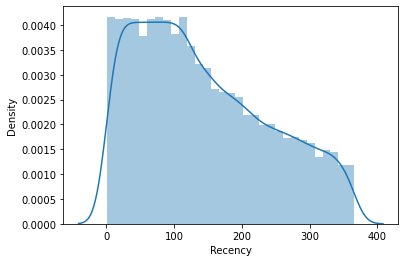

In [67]:
sns.distplot(datamart['Recency'])
plt.show()

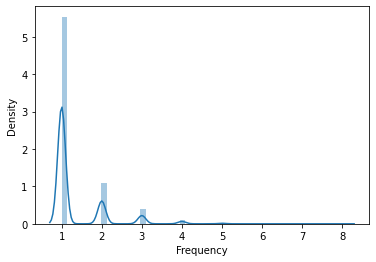

In [68]:
sns.distplot(datamart['Frequency'])
plt.show()

In [69]:
# removing customer id as it will not used in making cluster
df_kmeans = datamart[["Recency","Frequency"]]

# scaling the variables and store it in different df
standard_scaler = StandardScaler()
df_kmeans_norm = standard_scaler.fit_transform(df_kmeans)

# converting it into dataframe
df_kmeans_norm = pd.DataFrame(df_kmeans_norm)
df_kmeans_norm.columns = ['Recency','Frequency']
df_kmeans_norm.head()

,Recency,Frequency
0,-0.062659,0.982906
1,0.889632,2.435255
2,0.797475,0.982906
3,-0.165056,2.435255
4,-0.021700,2.435255


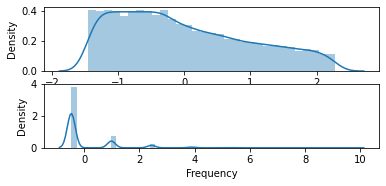

In [70]:
#Plot recency distribution
plt.subplot(3, 1, 1); sns.distplot(df_kmeans_norm['Recency'])

# Plot frequency distribution
plt.subplot(3, 1, 2); sns.distplot(df_kmeans_norm['Frequency'])

# Plot monetary value distribution
#plt.subplot(3, 1, 3); sns.distplot(df_kmeans_norm['MonetaryValue'])

# Show the plot
plt.show()

In [71]:
'''#methods to define n of clusters 
#Visual methods - elbow criterion
#
wcss = []
for i in range(1,11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(df_kmeans_norm)
    wcss.append(kmeans.inertia_)'''

"#methods to define n of clusters \n#Visual methods - elbow criterion\n#\nwcss = []\nfor i in range(1,11):\n    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)\n    kmeans.fit(df_kmeans_norm)\n    wcss.append(kmeans.inertia_)"

In [72]:
'''plt.figure(figsize = (10,8))
plt.plot(range(1, 11), wcss, marker = 'o', linestyle = '--')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-means Clustering')
plt.show()'''

"plt.figure(figsize = (10,8))\nplt.plot(range(1, 11), wcss, marker = 'o', linestyle = '--')\nplt.xlabel('Number of Clusters')\nplt.ylabel('WCSS')\nplt.title('K-means Clustering')\nplt.show()"

In [73]:
# Silhouette score has a range between +1 and -1 and the higher values denote a good clustering.

'''silhouette = []

for n in range(2,13):
  model = KMeans(n_clusters = n, random_state=0).fit(df_kmeans_norm)
  y_kmeans_pred = model.predict(df_kmeans_norm)
  score = silhouette_score(df_kmeans_norm, y_kmeans_pred)
  silhouette.append(score)
# Plotting elbow method
plt.xlabel('number of clusters')
plt.ylabel('Silhouette score')
plt.plot(range(2,13),silhouette)'''

"silhouette = []\n\nfor n in range(2,13):\n  model = KMeans(n_clusters = n, random_state=0).fit(df_kmeans_norm)\n  y_kmeans_pred = model.predict(df_kmeans_norm)\n  score = silhouette_score(df_kmeans_norm, y_kmeans_pred)\n  silhouette.append(score)\n# Plotting elbow method\nplt.xlabel('number of clusters')\nplt.ylabel('Silhouette score')\nplt.plot(range(2,13),silhouette)"

In [74]:
# Silhouette analysis

'''for num_clusters in list(range(2,11)):
    # intialise kmeans
    model_clus = KMeans(n_clusters = num_clusters, max_iter=50)
    model_clus.fit(df_kmeans_norm)
    
    cluster_labels = model_clus.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(df_kmeans_norm, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))'''

'for num_clusters in list(range(2,11)):\n    # intialise kmeans\n    model_clus = KMeans(n_clusters = num_clusters, max_iter=50)\n    model_clus.fit(df_kmeans_norm)\n    \n    cluster_labels = model_clus.labels_\n    \n    # silhouette score\n    silhouette_avg = silhouette_score(df_kmeans_norm, cluster_labels)\n    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))'

In [75]:
#!pip install termcolor

In [76]:
#!pip install plotly

In [77]:
#!pip install cufflinks

In [78]:
#!pip install pyclustertend

In [79]:
#!pip install yellowbrick

In [80]:

import colorama
from colorama import Fore, Style  # makes strings colored
from termcolor import colored
from termcolor import cprint


In [81]:
#For n_clusters=3, the silhouette score is 0.5280924155497753
for skew in df_kmeans_norm.skew():
    if -0.75 < skew < 0.75:
        print ("A skewness value of", '\033[1m', Fore.GREEN, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.GREEN, "symmetric", '\033[0m')
    elif  -0.75 < skew < -1.0 or 0.75 < skew < 1.0:
        print ("A skewness value of", '\033[1m', Fore.YELLOW, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.YELLOW, "moderately skewed", '\033[0m')
    else:
        print ("A skewness value of", '\033[1m', Fore.RED, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.RED, "highly skewed", '\033[0m')




A skewness value of   0.5044395712073064  means that the distribution is approx.   symmetric 
A skewness value of   2.4949439306349963  means that the distribution is approx.   highly skewed 


In [82]:
datamart

,Recency,Frequency,MonetaryValue,R,F,RFM_Segment,RFM_Score,General_Segment
CustomerID,,,,,,,,
2,137,2,1026.720024,2,4,2.04.0,6,VIP
3,230,3,2563.380028,1,4,1.04.0,5,Royal
7,221,2,1604.390022,1,4,1.04.0,5,Royal
8,127,3,800.730011,2,4,2.04.0,6,VIP
9,141,3,1852.870033,2,4,2.04.0,6,VIP
...,...,...,...,...,...,...,...,...
20753,1,1,161.869995,4,4,4.04.0,8,VIP
20754,1,1,172.660004,4,4,4.04.0,8,VIP
20755,1,1,314.640015,4,4,4.04.0,8,VIP


In [83]:
# !pip install pyforest
# 1-Import Libraies
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import datetime as dt
%matplotlib inline
import statsmodels.api as sm
import statsmodels.formula.api as smf
#import missingno as msno 
import plotly.express as px
import plotly.graph_objects as go
import datetime

from sklearn.compose import make_column_transformer
# Scaling
from sklearn.preprocessing import scale 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PowerTransformer 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler
# Modelling
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Importing plotly and cufflinks in offline mode
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
import plotly.graph_objects as go

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

In [84]:
# Import libraries
import pandas as pd
import numpy as np
from plotly import __version__
%matplotlib inline
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

init_notebook_mode(connected=True)
cf.go_offline()

In [85]:
# **Handling with Skewness - np.log**
for i in range(-1,1):
    skew_limit= i # This is our threshold-limit to evaluate skewness. Overall below abs(1) seems acceptable for the linear models. 
    skew_vals = datamart[['Recency', 'Frequency']].skew()
    skew_cols = skew_vals[abs(skew_vals)> skew_limit]
    print(skew_cols)

Recency      0.504440
Frequency    2.494944
dtype: float64
Recency      0.504440
Frequency    2.494944
dtype: float64


In [86]:
rfm_log = datamart[skew_cols.index].copy()

for col in skew_cols.index.values:
    rfm_log[col] = rfm_log[col].apply(np.log1p)

    print(rfm_log.skew())
print()

rfm_log.iplot(kind='histogram', subplots=True, bins=50);

Recency     -1.229062
Frequency    2.494944
dtype: float64
Recency     -1.229062
Frequency    1.904739
dtype: float64



In [87]:
for skew in datamart.skew():
    if -0.75 < skew < 0.75:
        print ("A skewness value of", '\033[1m', Fore.GREEN, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.GREEN, "symmetric", '\033[0m')
    elif  -0.75 < skew < -1.0 or 0.75 < skew < 1.0:
        print ("A skewness value of", '\033[1m', Fore.YELLOW, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.YELLOW, "moderately skewed", '\033[0m')
    else:
        print ("A skewness value of", '\033[1m', Fore.RED, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.RED, "highly skewed", '\033[0m')

A skewness value of   0.5044395712073066  means that the distribution is approx.   symmetric 
A skewness value of   2.4949439306349976  means that the distribution is approx.   highly skewed 
A skewness value of   1.6025245386778673  means that the distribution is approx.   highly skewed 
A skewness value of   -0.4291283092628153  means that the distribution is approx.   symmetric 


In [88]:
rfm_before_trans = datamart[skew_cols.index].copy()
pt = PowerTransformer(method='yeo-johnson')
trans= pt.fit_transform(rfm_before_trans)
rfm_trans = pd.DataFrame(trans, columns =skew_cols.index )

print(rfm_trans.skew())
print()

Recency     -0.146631
Frequency    1.317725
dtype: float64



In [89]:
for skew in rfm_trans.skew():
    if -0.75 < skew < 0.75:
        print ("A skewness value of", '\033[1m', Fore.GREEN, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.GREEN, "symmetric", '\033[0m')
    elif  -0.75 < skew < -1.0 or 0.75 < skew < 1.0:
        print ("A skewness value of", '\033[1m', Fore.YELLOW, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.YELLOW, "moderately skewed", '\033[0m')
    else:
        print ("A skewness value of", '\033[1m', Fore.RED, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.RED, "highly skewed", '\033[0m')

A skewness value of   -0.146631312329012  means that the distribution is approx.   symmetric 
A skewness value of   1.3177252049479407  means that the distribution is approx.   highly skewed 


In [90]:
rfm_log.iplot(kind='histogram',subplots=True,bins=50);


In [91]:
rfm_trans.iplot(kind='histogram', subplots=True, bins=50);


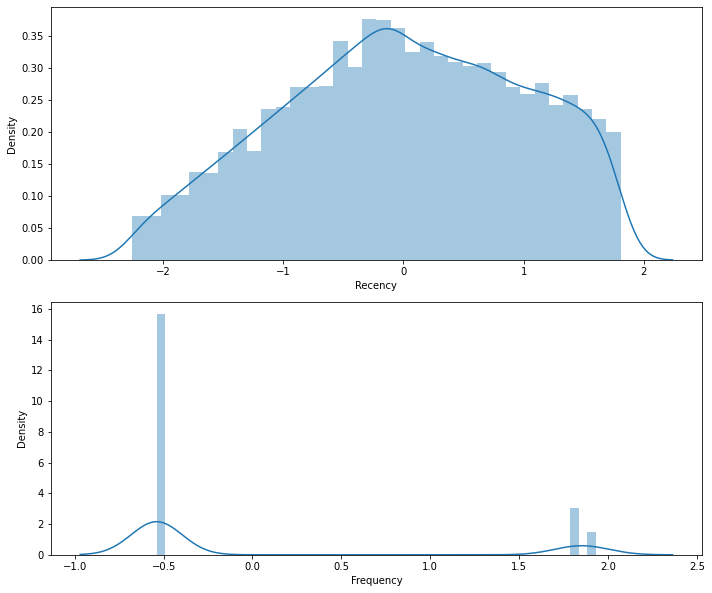

In [92]:
f, ax = plt.subplots(figsize=(10, 12))
plt.subplot(3, 1, 1); sns.distplot(rfm_trans.Recency, label = 'Recency')
plt.subplot(3, 1, 2); sns.distplot(rfm_trans.Frequency, label = 'Frequency')
#plt.subplot(3, 1, 3); sns.distplot(rfm_trans.MonetaryValue, label = 'MonetaryValue')
plt.style.use('default')
plt.tight_layout()
plt.show()

In [93]:

from sklearn.cluster import KMeans, AgglomerativeClustering
#from pyclustertend import hopkins
from sklearn.preprocessing import scale
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics import silhouette_samples,silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram
#from yellowbrick.cluster import KElbowVisualizer

In [94]:
scaler = StandardScaler()
scaler.fit(rfm_trans)

#Store it separately for clustering
rfm_scaled = scaler.transform(rfm_trans)

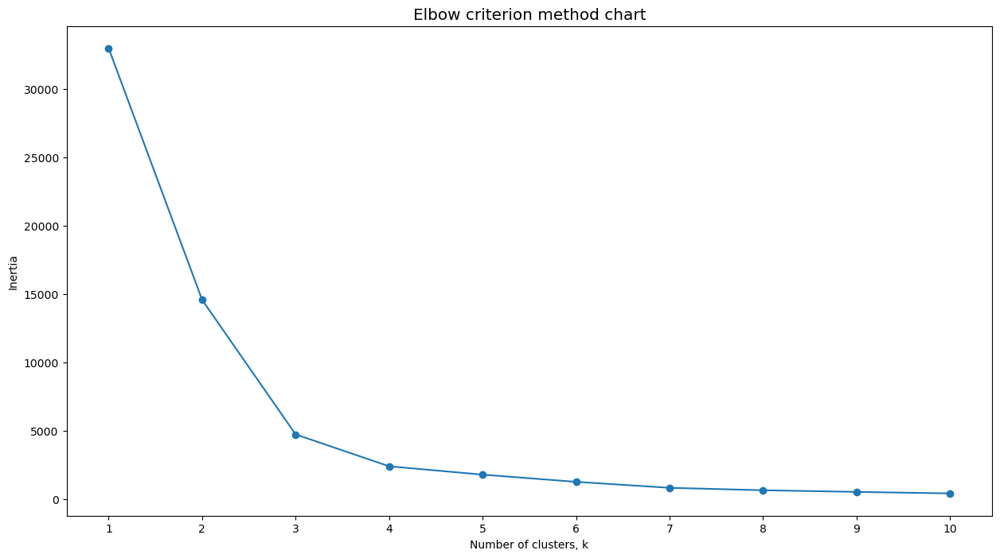

In [95]:
ks = range(1, 11)
inertias=[]
for k in ks :
    # Create a KMeans clusters
    kc = KMeans(n_clusters=k,init = "k-means++", max_iter = 300, n_init = 10, random_state=42)
    kc.fit(rfm_scaled)
    inertias.append(kc.inertia_)

# Plot ks vs inertias
f, ax = plt.subplots(figsize=(15, 8))
plt.plot(ks, inertias, '-o')
plt.xlabel('Number of clusters, k')
plt.ylabel('Inertia')
plt.xticks(ks)
plt.style.use('ggplot')
plt.title('Elbow criterion method chart')
plt.show()

In [96]:
ssd =[]

K = range(2, 11)

for k in K:
    model = KMeans(n_clusters=k)
    model.fit(rfm_scaled)
    ssd.append(model.inertia_)
    print(f'Silhouette Score for {k} clusters: {silhouette_score(rfm_scaled, model.labels_)}')

Silhouette Score for 2 clusters: 0.6218214415169113
Silhouette Score for 3 clusters: 0.6618621870632946
Silhouette Score for 4 clusters: 0.6414997758326187
Silhouette Score for 5 clusters: 0.6050630656211177
Silhouette Score for 6 clusters: 0.5592434214658271
Silhouette Score for 7 clusters: 0.5754801796589776
Silhouette Score for 8 clusters: 0.5632751922458051
Silhouette Score for 9 clusters: 0.5634436830757019
Silhouette Score for 10 clusters: 0.5527334268399049


In [97]:
'''from sklearn.cluster import KMeans

from yellowbrick.cluster import SilhouetteVisualizer

model_3 = KMeans(n_clusters=3, random_state=42)
visualizer = SilhouetteVisualizer(model_3)

visualizer.fit(rfm_scaled)    # Fit the data to the visualizer
visualizer.poof();'''

'from sklearn.cluster import KMeans\n\nfrom yellowbrick.cluster import SilhouetteVisualizer\n\nmodel_3 = KMeans(n_clusters=3, random_state=42)\nvisualizer = SilhouetteVisualizer(model_3)\n\nvisualizer.fit(rfm_scaled)    # Fit the data to the visualizer\nvisualizer.poof();'

In [98]:
kmeans = KMeans(n_clusters = 3,init = "k-means++", max_iter = 300, n_init = 10, random_state=42).fit(rfm_scaled)
kmeans.fit_predict(rfm_scaled)
labels = kmeans.labels_
rfm_trans['ClusterID']=labels
rfm_trans

,Recency,Frequency,ClusterID
0,0.135319,1.820528,1
1,0.917587,1.920674,1
2,0.850016,1.820528,1
3,0.036634,1.920674,1
4,0.173761,1.920674,1
...,...,...,...
16491,-2.260070,-0.538992,0
16492,-2.260070,-0.538992,0
16493,-2.260070,-0.538992,0
16494,-2.260070,-0.538992,0


In [99]:
print("Predicted Clusters")
rfm_trans.ClusterID.value_counts()

Predicted Clusters


0    8356
2    4425
1    3715
Name: ClusterID, dtype: int64

In [100]:
"""trace1 = go.Scatter3d(
    x= rfm_trans['Recency'],
    y= rfm_trans['Frequency'],
    z= rfm_trans['MonetaryValue'],
    mode='markers',
     marker=dict(
        color = rfm_trans['ClusterID'], 
        size= 10,
        line=dict(
            color= rfm_trans['ClusterID'],
            width= 12
        ),
        opacity=0.8
     )
)
data = [trace1]
layout = go.Layout(
#     margin=dict(
#         l=0,
#         r=0,
#         b=0,
#         t=0
#     )
    title= 'Clusters',
    scene = dict(
            xaxis = dict(title  = 'Recency'),
            yaxis = dict(title  = 'Frequency'),
            zaxis = dict(title  = 'MonetaryValue')
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)"""

"trace1 = go.Scatter3d(\n    x= rfm_trans['Recency'],\n    y= rfm_trans['Frequency'],\n    z= rfm_trans['MonetaryValue'],\n    mode='markers',\n     marker=dict(\n        color = rfm_trans['ClusterID'], \n        size= 10,\n        line=dict(\n            color= rfm_trans['ClusterID'],\n            width= 12\n        ),\n        opacity=0.8\n     )\n)\ndata = [trace1]\nlayout = go.Layout(\n#     margin=dict(\n#         l=0,\n#         r=0,\n#         b=0,\n#         t=0\n#     )\n    title= 'Clusters',\n    scene = dict(\n            xaxis = dict(title  = 'Recency'),\n            yaxis = dict(title  = 'Frequency'),\n            zaxis = dict(title  = 'MonetaryValue')\n        )\n)\nfig = go.Figure(data=data, layout=layout)\npy.offline.iplot(fig)"

In [101]:
"""fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(rfm_trans[ClusterID == 0,0],rfm_trans[ClusterID == 0,1],rfm_trans[ClusterID == 0,2], s = 40 , color = 'blue', label = "cluster 0")
ax.scatter(rfm_trans[ClusterID == 1,0],rfm_trans[ClusterID == 1,1],rfm_trans[ClusterID == 1,2], s = 40 , color = 'orange', label = "cluster 1")
ax.scatter(rfm_trans[ClusterID == 2,0],rfm_trans[ClusterID == 2,1],rfm_trans[ClusterID == 2,2], s = 40 , color = 'green', label = "cluster 2")

ax.set_xlabel('Age of a customer-->')
ax.set_ylabel('Anual Income-->')
ax.set_zlabel('Spending Score-->')
ax.legend()
plt.show()"""

'fig = plt.figure(figsize = (15,15))\nax = fig.add_subplot(111, projection=\'3d\')\n\nax.scatter(rfm_trans[ClusterID == 0,0],rfm_trans[ClusterID == 0,1],rfm_trans[ClusterID == 0,2], s = 40 , color = \'blue\', label = "cluster 0")\nax.scatter(rfm_trans[ClusterID == 1,0],rfm_trans[ClusterID == 1,1],rfm_trans[ClusterID == 1,2], s = 40 , color = \'orange\', label = "cluster 1")\nax.scatter(rfm_trans[ClusterID == 2,0],rfm_trans[ClusterID == 2,1],rfm_trans[ClusterID == 2,2], s = 40 , color = \'green\', label = "cluster 2")\n\nax.set_xlabel(\'Age of a customer-->\')\nax.set_ylabel(\'Anual Income-->\')\nax.set_zlabel(\'Spending Score-->\')\nax.legend()\nplt.show()'

In [102]:
rfm_trans['Labels'] = rfm_trans['ClusterID'].map({0:'Churned/Needed Attention Customers', 1:'Current Custemer', 2:'Top/Best Customer'})
rfm_trans.sample(10) 

,Recency,Frequency,ClusterID,Labels
10987,-0.453896,-0.538992,0,Churned/Needed Attention Customers
759,0.505831,1.820528,1,Current Custemer
28,0.827181,-0.538992,2,Top/Best Customer
12470,-0.750107,-0.538992,0,Churned/Needed Attention Customers
14014,-1.144355,-0.538992,0,Churned/Needed Attention Customers
16204,-2.012946,-0.538992,0,Churned/Needed Attention Customers
4853,0.375904,1.930979,1,Current Custemer
15389,-1.591108,-0.538992,0,Churned/Needed Attention Customers
3556,1.243553,-0.538992,2,Top/Best Customer
16053,-1.923265,-0.538992,0,Churned/Needed Attention Customers


In [103]:
rfm_trans.Labels.value_counts()

Churned/Needed Attention Customers    8356
Top/Best Customer                     4425
Current Custemer                      3715
Name: Labels, dtype: int64

In [104]:
rfm_trans[rfm_trans['Labels'] == "Churned/Needed Attention Customers"]


,Recency,Frequency,ClusterID,Labels
9,0.006263,-0.538992,0,Churned/Needed Attention Customers
18,0.096301,-0.538992,0,Churned/Needed Attention Customers
57,0.096301,-0.538992,0,Churned/Needed Attention Customers
110,0.086453,-0.538992,0,Churned/Needed Attention Customers
141,0.026552,-0.538992,0,Churned/Needed Attention Customers
...,...,...,...,...
16491,-2.260070,-0.538992,0,Churned/Needed Attention Customers
16492,-2.260070,-0.538992,0,Churned/Needed Attention Customers
16493,-2.260070,-0.538992,0,Churned/Needed Attention Customers
16494,-2.260070,-0.538992,0,Churned/Needed Attention Customers


In [105]:
rfm_trans[rfm_trans['Labels'] == "Top/Best Customer"]


,Recency,Frequency,ClusterID,Labels
5,1.454140,-0.538992,2,Top/Best Customer
7,0.638398,-0.538992,2,Top/Best Customer
11,1.350323,-0.538992,2,Top/Best Customer
12,1.376545,-0.538992,2,Top/Best Customer
13,0.613979,-0.538992,2,Top/Best Customer
...,...,...,...,...
8339,0.322231,-0.538992,2,Top/Best Customer
8340,0.734195,-0.538992,2,Top/Best Customer
8344,0.734195,-0.538992,2,Top/Best Customer
8346,0.497347,-0.538992,2,Top/Best Customer


In [106]:
rfm_trans[rfm_trans['Labels'] == "Current Custemer"]


,Recency,Frequency,ClusterID,Labels
0,0.135319,1.820528,1,Current Custemer
1,0.917587,1.920674,1,Current Custemer
2,0.850016,1.820528,1,Current Custemer
3,0.036634,1.920674,1,Current Custemer
4,0.173761,1.920674,1,Current Custemer
...,...,...,...,...
8331,0.285866,1.930979,1,Current Custemer
8338,0.819534,1.820528,1,Current Custemer
8341,-0.003944,1.820528,1,Current Custemer
8342,0.006263,1.820528,1,Current Custemer


In [107]:
rfm_trans.agg(["mean" , "std"]).round()

,Recency,Frequency,ClusterID
mean,0.0,-0.0,1.0
std,1.0,1.0,1.0


In [108]:
datamart['ClusterID'] = labels
datamart.sample(20)

,Recency,Frequency,MonetaryValue,R,F,RFM_Segment,RFM_Score,General_Segment,ClusterID
CustomerID,,,,,,,,,
19356,21,1,268.760010,4,3,4.03.0,7,VIP,0
18876,28,1,204.520004,4,3,4.03.0,7,VIP,0
5898,177,2,1186.739998,2,4,2.04.0,6,VIP,1
8123,170,5,2422.270008,2,4,2.04.0,6,VIP,1
17135,53,1,38.959999,4,3,4.03.0,7,VIP,0
17425,49,1,189.919998,4,3,4.03.0,7,VIP,0
11659,177,2,661.309990,2,4,2.04.0,6,VIP,1
18966,27,1,260.649994,4,3,4.03.0,7,VIP,0
3064,172,2,1437.570011,2,4,2.04.0,6,VIP,1


# 
- Cluster 0 : The first cluster is more related to the "churned/Needed Attention Customers" who used to visit and shopping at different frequencies or who are still customer but haven’t been visiting recently. The store/department should bring them back with relevant personalized promotions, and run surveys to find out what went wrong and avoid losing them to a competitor.

- Cluster 1 : The second cluster belongs to the "Current Custemer" who have been shopping at different frequencies and spending in varying amounts. The store/department should offer membership or loyalty programs or recommend related products to upsell them and help them become its Loyalists or Champions, and offer renewals and helpful products to encourage another purchase.

- Cluster 2 : The third cluster can be interpreted as "Top/Best Customers" who have been shopping in average frequency or most recently, but spent a good amount. The store/department should reward or offer membership or loyalty programs them to become its Loyalists or Champions.

In [109]:
# column to added from first dataframe to second
extracted_col = rfm_trans['Labels']

# Second dataframe after adding column from first dataframe
#datamart.insert(9, "K-Means Predicted Cluster", extracted_col)
# customer_rfm = customer_rfm.join(extracted_col)
datamart['K-Means Predicted Cluster'] = rfm_trans['Labels'].values
datamart.sample(10)

,Recency,Frequency,MonetaryValue,R,F,RFM_Segment,RFM_Score,General_Segment,ClusterID,K-Means Predicted Cluster
CustomerID,,,,,,,,,,
3000,163,1,219.960007,2,1,2.01.0,3,About to Churn,2,Top/Best Customer
12285,152,2,2118.220024,2,4,2.04.0,6,VIP,1,Current Custemer
13510,106,1,339.029999,3,2,3.02.0,5,Royal,0,Churned/Needed Attention Customers
2691,148,1,301.169998,2,1,2.01.0,3,About to Churn,2,Top/Best Customer
14839,87,1,443.019989,3,2,3.02.0,5,Royal,0,Churned/Needed Attention Customers
480,362,1,880.030003,1,1,1.01.0,2,About to Churn,2,Top/Best Customer
13345,109,1,443.000000,3,2,3.02.0,5,Royal,0,Churned/Needed Attention Customers
2355,259,1,1148.440018,1,1,1.01.0,2,About to Churn,2,Top/Best Customer
14737,88,1,369.179993,3,2,3.02.0,5,Royal,0,Churned/Needed Attention Customers


In [110]:
datamart.sample(10)

,Recency,Frequency,MonetaryValue,R,F,RFM_Segment,RFM_Score,General_Segment,ClusterID,K-Means Predicted Cluster
CustomerID,,,,,,,,,,
6678,175,2,166.469997,2,4,2.04.0,6,VIP,1,Current Custemer
16609,61,1,82.709999,4,3,4.03.0,7,VIP,0,Churned/Needed Attention Customers
7491,186,2,578.599998,2,4,2.04.0,6,VIP,1,Current Custemer
19855,14,1,34.980000,4,3,4.03.0,7,VIP,0,Churned/Needed Attention Customers
1363,251,2,827.850006,1,4,1.04.0,5,Royal,1,Current Custemer
12883,115,1,10.950000,3,2,3.02.0,5,Royal,0,Churned/Needed Attention Customers
9833,171,3,2566.830059,2,4,2.04.0,6,VIP,1,Current Custemer
14000,99,1,339.250000,3,2,3.02.0,5,Royal,0,Churned/Needed Attention Customers
12309,127,2,616.730015,2,4,2.04.0,6,VIP,1,Current Custemer


In [111]:
fig = px.pie(df, values = datamart['K-Means Predicted Cluster'].value_counts(), 
             names = (datamart['K-Means Predicted Cluster'].value_counts()).index, 
             title = 'Predicted Clusters Distribution' ,
             hole=.6) 



fig.show()

In [112]:
datamart['General_Segment'].value_counts()


VIP               6985
Royal             5124
About to Churn    4387
Name: General_Segment, dtype: int64

In [113]:
RFM_Customer_Segment = pd.DataFrame(datamart['General_Segment'].value_counts(dropna=False).sort_values(ascending=False))
RFM_Customer_Segment.reset_index(inplace=True)
RFM_Customer_Segment.rename(columns={'index':'RFM Customer Segment', 'General_Segment':'The Number Of Customer'}, inplace=True)
RFM_Customer_Segment

,RFM Customer Segment,The Number Of Customer
0,VIP,6985
1,Royal,5124
2,About to Churn,4387


In [114]:
KMEANS_Customer_Segment = pd.DataFrame(datamart['K-Means Predicted Cluster'].value_counts(dropna=False).sort_values(ascending=False))
KMEANS_Customer_Segment.reset_index(inplace=True)
KMEANS_Customer_Segment.rename(columns={'index':'k-means Customer Segment', 'K-Means Predicted Cluster':'The Number Of Customer'}, inplace=True)
KMEANS_Customer_Segment

,k-means Customer Segment,The Number Of Customer
0,Churned/Needed Attention Customers,8356
1,Top/Best Customer,4425
2,Current Custemer,3715


In [115]:
datamart['K-Means Predicted Cluster'].value_counts()


Churned/Needed Attention Customers    8356
Top/Best Customer                     4425
Current Custemer                      3715
Name: K-Means Predicted Cluster, dtype: int64

In [116]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=datamart['K-Means Predicted Cluster'].values,
    y=datamart['K-Means Predicted Cluster'].index,
    name='Predicted-Clusters By K-Means',
    marker_color='#191970'
    
))
fig.add_trace(go.Bar(
    x=datamart['General_Segment'].values,
    y=datamart['K-Means Predicted Cluster'].index,
    name='Customer-Segment By RFM Analysis',
    marker_color='#8B7D7B'
))

# Here we modify the tickangle of the xaxis, resulting in rotated labels.
fig.update_layout(barmode='relative', 
                  xaxis_tickangle=-45, 
                  title="The Comparison of Predicted-Clusters By K-Means vs Customer-Segment By RFM Analysis")
fig.update_traces(dict(marker_line_width=0))
fig.show()

In [117]:
'''from sklearn.decomposition import PCA

pca = PCA(n_components = 2)
pca = pca.fit_transform(rfm_scaled)

plt.figure(figsize = (12,8))
plt.scatter(pca[:,0], pca[:,1], c = kmeans.labels_)
plt.title("Clusters of Customers", fontsize = 20);'''

'from sklearn.decomposition import PCA\n\npca = PCA(n_components = 2)\npca = pca.fit_transform(rfm_scaled)\n\nplt.figure(figsize = (12,8))\nplt.scatter(pca[:,0], pca[:,1], c = kmeans.labels_)\nplt.title("Clusters of Customers", fontsize = 20);'

In [118]:
"""# Import the non-negative matrix factorization module
from sklearn.decomposition import NMF

# Initialize NMF instance with 4 components
nmf = NMF(3)

# Fit the model on the wholesale sales data
qq = datamart[['Recency', 'Frequency', 'MonetaryValue']]
nmf.fit(qq)

# Extract the components 
components = pd.DataFrame(data=nmf.components_, columns=qq.columns)


qq"""

"# Import the non-negative matrix factorization module\nfrom sklearn.decomposition import NMF\n\n# Initialize NMF instance with 4 components\nnmf = NMF(3)\n\n# Fit the model on the wholesale sales data\nqq = datamart[['Recency', 'Frequency', 'MonetaryValue']]\nnmf.fit(qq)\n\n# Extract the components \ncomponents = pd.DataFrame(data=nmf.components_, columns=qq.columns)\n\n\nqq"

In [119]:
"""from sklearn.cluster import KMeans
kmeans=KMeans(n_clusters=3)
kmeans.fit(wholesale_scaled_df)
wholesale_kmeans4 = wholesale.assign(segment = kmeans.labels_)
"""

'from sklearn.cluster import KMeans\nkmeans=KMeans(n_clusters=3)\nkmeans.fit(wholesale_scaled_df)\nwholesale_kmeans4 = wholesale.assign(segment = kmeans.labels_)\n'

In [120]:
"""kmeans = KMeans(n_clusters = 3).fit(rfm_scaled)
kmeans.fit_predict(rfm_scaled)
labels = kmeans.labels_
rfm_trans['ClusterID']=labels
rfm_trans




from sklearn.cluster import KMeans 
kmeans=KMeans(n_clusters=k)
kmeans.fit(wholesale_scaled_df)
wholesale_kmeans4 = wholesale.assign(segment = kmeans.labels_)

"""

"kmeans = KMeans(n_clusters = 3).fit(rfm_scaled)\nkmeans.fit_predict(rfm_scaled)\nlabels = kmeans.labels_\nrfm_trans['ClusterID']=labels\nrfm_trans\n\n\n\n\nfrom sklearn.cluster import KMeans \nkmeans=KMeans(n_clusters=k)\nkmeans.fit(wholesale_scaled_df)\nwholesale_kmeans4 = wholesale.assign(segment = kmeans.labels_)\n\n"

In [121]:
"""AS = datamart[["Recency","Frequency","MonetaryValue"]]

from sklearn.decomposition import NMF
nmf = NMF(3)
nmf.fit(AS)
components = pd.DataFrame(nmf.components_, columns=AS.columns)
#segment_weights = pd.DataFrame(nmf.transform(wholesale, columns=components.index)
#segment_weights.index = wholesale.index
#wholesale_nmf = wholesale.assign(segment = segment_weights.idxmax(axis=1))


W = pd.DataFrame(data=nmf.transform(AS), columns=components.index)
W.index = AS.index

# Assign the column name where the corresponding value is the largest
wholesale_nmf3 = AS.assign(segment = W.idxmax(axis=1))

# Calculate the average column values per each segment
nmf3_averages = wholesale_nmf3.groupby('segment').mean().round(0)

# Plot the average values as heatmap
sns.heatmap(nmf3_averages, cmap='twilight')

# Display the chart
plt.show()
"""

'AS = datamart[["Recency","Frequency","MonetaryValue"]]\n\nfrom sklearn.decomposition import NMF\nnmf = NMF(3)\nnmf.fit(AS)\ncomponents = pd.DataFrame(nmf.components_, columns=AS.columns)\n#segment_weights = pd.DataFrame(nmf.transform(wholesale, columns=components.index)\n#segment_weights.index = wholesale.index\n#wholesale_nmf = wholesale.assign(segment = segment_weights.idxmax(axis=1))\n\n\nW = pd.DataFrame(data=nmf.transform(AS), columns=components.index)\nW.index = AS.index\n\n# Assign the column name where the corresponding value is the largest\nwholesale_nmf3 = AS.assign(segment = W.idxmax(axis=1))\n\n# Calculate the average column values per each segment\nnmf3_averages = wholesale_nmf3.groupby(\'segment\').mean().round(0)\n\n# Plot the average values as heatmap\nsns.heatmap(nmf3_averages, cmap=\'twilight\')\n\n# Display the chart\nplt.show()\n'

In [122]:
#wholesale_nmf3

In [123]:
#wholesale_nmf3.segment.value_counts()

#
Annotation:

Limitations of K-means clustering:

There is no assurance that it will lead to the global best solution.
Can't deal with different shapes(not circular) and consider one point's probability of belonging to more than one cluster.
These disadvantages of K-means show that for many datasets (especially low-dimensional datasets), it may not perform as well as you might hope.


8 - CREATING COHORT & CONDUCTING COHORT ANALYSIS

In [124]:
df

,CustomerID,Customer_City,Customer_Country,OrderID,Category_Name,Product_Name,Order_date,Order_Quantity,Product_Price,Order_Discount,Total_price,Order_Status,Order_Country,Latitude,Longitude,Order City
0,20755,Caguas,Puerto Rico,77202,Sporting Goods,Smart watch,2018-01-31 22:56:00,1,327.750000,13.110000,314.640015,COMPLETE,Indonesia,18.251453,-66.037056,Bekasi
1,19492,Caguas,Puerto Rico,75939,Sporting Goods,Smart watch,2018-01-13 12:27:00,1,327.750000,16.389999,311.359985,PENDING,India,18.279451,-66.037064,Bikaner
2,19491,San Jose,EE. UU.,75938,Sporting Goods,Smart watch,2018-01-13 12:06:00,1,327.750000,18.030001,309.720001,CLOSED,India,37.292233,-121.881279,Bikaner
3,19490,Los Angeles,EE. UU.,75937,Sporting Goods,Smart watch,2018-01-13 11:45:00,1,327.750000,22.940001,304.809998,COMPLETE,Australia,34.125946,-118.291016,Townsville
4,19489,Caguas,Puerto Rico,75936,Sporting Goods,Smart watch,2018-01-13 11:24:00,1,327.750000,29.500000,298.250000,PENDING_PAYMENT,Australia,18.253769,-66.037048,Townsville
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179624,9204,Caguas,Puerto Rico,60127,Cleats,Perfect Fitness Perfect Rip Deck,2017-05-27 16:48:00,5,59.990002,44.990002,254.960007,PENDING,Brasil,18.284536,-66.370605,Maceió
179626,10240,Caguas,Puerto Rico,58682,Cleats,Perfect Fitness Perfect Rip Deck,2017-05-06 14:34:00,5,59.990002,50.990002,248.960007,PENDING,Honduras,18.281187,-66.370613,Choluteca
179627,3,Caguas,Puerto Rico,56178,Cleats,Perfect Fitness Perfect Rip Deck,2017-03-31 01:18:00,5,59.990002,53.990002,245.960007,PENDING,Honduras,18.025375,-66.615082,Tegucigalpa
179628,7024,Caguas,Puerto Rico,59542,Cleats,Perfect Fitness Perfect Rip Deck,2017-05-19 03:51:00,5,59.990002,74.989998,224.960007,PENDING,México,18.229071,-66.370583,Mexico City


# Cohort analysis
1.1st Cohort: User number & Retention Rate

In [125]:
cohort_df = df
def first_of_month(date):    
    formatted_date = dt.datetime.strptime(str(date), "%Y-%m-%d %H:%M:%S")
    return dt.datetime(formatted_date.year, formatted_date.month, 1)
cohort_df['Ordermonth'] = cohort_df['Order_date'].apply(first_of_month)
cohort_df.head(10)#

,CustomerID,Customer_City,Customer_Country,OrderID,Category_Name,Product_Name,Order_date,Order_Quantity,Product_Price,Order_Discount,Total_price,Order_Status,Order_Country,Latitude,Longitude,Order City,Ordermonth
0,20755,Caguas,Puerto Rico,77202,Sporting Goods,Smart watch,2018-01-31 22:56:00,1,327.75,13.110000,314.640015,COMPLETE,Indonesia,18.251453,-66.037056,Bekasi,2018-01-01
1,19492,Caguas,Puerto Rico,75939,Sporting Goods,Smart watch,2018-01-13 12:27:00,1,327.75,16.389999,311.359985,PENDING,India,18.279451,-66.037064,Bikaner,2018-01-01
2,19491,San Jose,EE. UU.,75938,Sporting Goods,Smart watch,2018-01-13 12:06:00,1,327.75,18.030001,309.720001,CLOSED,India,37.292233,-121.881279,Bikaner,2018-01-01
3,19490,Los Angeles,EE. UU.,75937,Sporting Goods,Smart watch,2018-01-13 11:45:00,1,327.75,22.940001,304.809998,COMPLETE,Australia,34.125946,-118.291016,Townsville,2018-01-01
4,19489,Caguas,Puerto Rico,75936,Sporting Goods,Smart watch,2018-01-13 11:24:00,1,327.75,29.500000,298.250000,PENDING_PAYMENT,Australia,18.253769,-66.037048,Townsville,2018-01-01
6,19487,Caguas,Puerto Rico,75934,Sporting Goods,Smart watch,2018-01-13 10:42:00,1,327.75,39.330002,288.420013,COMPLETE,China,18.242538,-66.037056,Guangzhou,2018-01-01
7,19486,Miami,EE. UU.,75933,Sporting Goods,Smart watch,2018-01-13 10:21:00,1,327.75,42.610001,285.140015,PROCESSING,China,25.928869,-80.162872,Guangzhou,2018-01-01
8,19485,Caguas,Puerto Rico,75932,Sporting Goods,Smart watch,2018-01-13 10:00:00,1,327.75,49.160000,278.589996,CLOSED,China,18.233223,-66.037056,Guangzhou,2018-01-01
9,19484,San Ramon,EE. UU.,75931,Sporting Goods,Smart watch,2018-01-13 09:39:00,1,327.75,52.439999,275.309998,CLOSED,China,37.773991,-121.966629,Guangzhou,2018-01-01
10,19483,Caguas,Puerto Rico,75930,Sporting Goods,Smart watch,2018-01-13 09:18:00,1,327.75,55.720001,272.029999,SUSPECTED_FRAUD,Japón,18.282845,-66.037056,Tokio,2018-01-01


In [126]:
cohort_df['cohortmonth'] = cohort_df.groupby('CustomerID')['Ordermonth'].transform('min')
cohort_df.sample(10)

,CustomerID,Customer_City,Customer_Country,OrderID,Category_Name,Product_Name,Order_date,Order_Quantity,Product_Price,Order_Discount,Total_price,Order_Status,Order_Country,Latitude,Longitude,Order City,Ordermonth,cohortmonth
51845,9992,Caguas,Puerto Rico,59970,Women's Golf Clubs,Cleveland Golf Collegiate My Custom Wedge 588,2017-05-25 09:48:00,1,209.990005,2.10,207.889999,PENDING,Belice,18.299337,-66.370560,San Ignacio,2017-05-01,2017-03-01
156863,6526,Caguas,Puerto Rico,62946,Cardio Equipment,Nike Men's Free 5.0+ Running Shoe,2017-07-07 20:26:00,4,99.989998,16.00,383.959992,PROCESSING,Austria,18.252874,-66.370537,Viena,2017-07-01,2017-07-01
56588,4551,Caguas,Puerto Rico,57491,Cleats,Perfect Fitness Perfect Rip Deck,2017-04-19 05:18:00,3,59.990002,18.00,161.970001,COMPLETE,México,18.249447,-66.370583,Tijuana,2017-04-01,2017-04-01
105967,514,La Habra,EE. UU.,58603,Indoor/Outdoor Games,O'Brien Men's Neoprene Life Vest,2017-05-05 10:53:00,3,49.980000,13.49,136.449997,COMPLETE,México,38.286076,-122.360169,Mexico City,2017-05-01,2017-05-01
123007,9836,Caguas,Puerto Rico,62359,Shop By Sport,Under Armour Girls' Toddler Spine Surge Runni,2017-06-29 06:47:00,4,39.990002,1.60,158.360001,PENDING,Alemania,18.274376,-66.370575,Baden-Baden,2017-06-01,2017-06-01
40841,7,Caguas,Puerto Rico,62132,Camping & Hiking,Diamondback Women's Serene Classic Comfort Bi,2017-06-25 23:15:00,1,299.980011,0.00,299.980011,ON_HOLD,Alemania,18.359095,-66.079956,Krefeld,2017-06-01,2017-06-01
53086,8763,Santee,EE. UU.,67111,Water Sports,Pelican Sunstream 100 Kayak,2017-09-06 15:37:00,1,199.990005,8.00,191.990005,ON_HOLD,Italia,32.856239,-116.975441,Civitavecchia,2017-09-01,2017-06-01
23835,5072,New York,EE. UU.,59929,Cleats,Perfect Fitness Perfect Rip Deck,2017-05-24 19:26:00,2,59.990002,15.60,104.379997,CLOSED,México,40.726681,-73.979713,Mexico City,2017-05-01,2017-02-01
138581,2758,Phoenix,EE. UU.,55642,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,2017-03-23 05:31:00,1,399.980011,36.00,363.980011,ON_HOLD,México,33.798260,-112.168785,Juárez,2017-03-01,2017-03-01
86617,17758,Miami,EE. UU.,74205,CDs,CDs of rock,2017-12-19 04:57:00,1,11.290000,1.02,10.270000,SUSPECTED_FRAUD,Indonesia,25.746140,-80.391762,Yakarta,2017-12-01,2017-12-01


In [127]:
def get_month_int(df, column):
    year = df[column].dt.year
    month = df[column].dt.month
    day = df[column].dt.day
    return year, month, day
invoice_year, invoice_month, invoice_day = get_month_int(cohort_df, 'Ordermonth')
cohort_year, cohort_month, cohort_day = get_month_int(cohort_df, 'cohortmonth')

In [128]:
cohort_year

0         2018
1         2018
2         2018
3         2018
4         2018
          ... 
179624    2017
179626    2017
179627    2017
179628    2017
179629    2017
Name: cohortmonth, Length: 49211, dtype: int64

In [129]:
year_diff = invoice_year - cohort_year 
month_diff = invoice_month - cohort_month 

cohort_df['cohortindex'] = year_diff * 12 + month_diff + 1 

In [130]:
cohort_df.sample(10)


,CustomerID,Customer_City,Customer_Country,OrderID,Category_Name,Product_Name,Order_date,Order_Quantity,Product_Price,Order_Discount,Total_price,Order_Status,Order_Country,Latitude,Longitude,Order City,Ordermonth,cohortmonth,cohortindex
28756,2528,Mount Pleasant,EE. UU.,59674,Cardio Equipment,Nike Men's Free 5.0+ Running Shoe,2017-05-21 02:06:00,4,99.989998,79.989998,319.970001,PENDING_PAYMENT,México,43.615131,-84.607933,Tijuana,2017-05-01,2017-05-01,1
137408,5841,Caguas,Puerto Rico,60292,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,2017-05-30 02:37:00,1,399.980011,20.000000,379.980011,COMPLETE,México,18.238306,-66.370544,Zapopan,2017-05-01,2017-05-01,1
91501,1983,Caguas,Puerto Rico,63559,Cleats,Perfect Fitness Perfect Rip Deck,2017-07-16 19:11:00,2,59.990002,21.600000,98.379997,PENDING_PAYMENT,Francia,18.265100,-66.370583,Gennevilliers,2017-07-01,2017-07-01,1
87848,4481,Doylestown,EE. UU.,52505,Men's Footwear,Nike Men's CJ Elite 2 TD Football Cleat,2017-02-05 10:29:00,1,129.990005,19.500000,110.489998,PENDING_PAYMENT,Chile,40.311440,-75.132889,Talcahuano,2017-02-01,2017-02-01,1
172575,4948,Caguas,Puerto Rico,58931,Shop By Sport,Under Armour Girls' Toddler Spine Surge Runni,2017-05-10 05:48:00,3,39.990002,0.000000,119.970001,CLOSED,México,18.252361,-66.370537,Hermosillo,2017-05-01,2017-05-01,1
165363,8141,Houston,EE. UU.,56182,Electronics,Bridgestone e6 Straight Distance NFL San Dieg,2017-03-31 02:42:00,1,31.990000,0.320000,31.670000,PENDING_PAYMENT,México,29.776413,-95.372482,Culiacán,2017-03-01,2017-03-01,1
115330,4278,Opelousas,EE. UU.,67435,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,2017-09-11 09:08:00,1,399.980011,28.000000,371.980011,PENDING,Austria,30.569954,-92.072121,Linz,2017-09-01,2017-07-01,3
105883,6411,Caguas,Puerto Rico,58887,Indoor/Outdoor Games,O'Brien Men's Neoprene Life Vest,2017-05-09 14:23:00,1,49.980000,5.000000,44.980000,COMPLETE,Colombia,18.254206,-66.370636,Manizales,2017-05-01,2017-05-01,1
67367,6092,Caguas,Puerto Rico,64763,Shop By Sport,Under Armour Girls' Toddler Spine Surge Runni,2017-08-03 09:00:00,3,39.990002,19.200001,100.769997,COMPLETE,Reino Unido,18.214872,-66.370583,Sheffield,2017-08-01,2017-07-01,2
17048,13431,Richmond,EE. UU.,69878,Cameras,Web Camera,2017-10-17 01:01:00,1,452.040008,24.860001,427.179993,CLOSED,Alemania,39.827408,-84.890228,Rostock,2017-10-01,2017-10-01,1


In [131]:
#cohort_df.to_csv('DATA_cleaned.csv', index=False)


In [132]:
first_cohort = cohort_df.groupby(['cohortmonth', 'cohortindex'])['CustomerID'].nunique().reset_index()
first_cohort.head()

,cohortmonth,cohortindex,CustomerID
0,2017-01-01,1,54
1,2017-01-01,2,11
2,2017-01-01,3,4
3,2017-01-01,4,4
4,2017-01-01,5,10


In [133]:
cohort_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49211 entries, 0 to 179629
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   CustomerID        49211 non-null  int64         
 1   Customer_City     49211 non-null  object        
 2   Customer_Country  49211 non-null  object        
 3   OrderID           49211 non-null  int64         
 4   Category_Name     49211 non-null  object        
 5   Product_Name      49211 non-null  object        
 6   Order_date        49211 non-null  datetime64[ns]
 7   Order_Quantity    49211 non-null  int64         
 8   Product_Price     49211 non-null  float64       
 9   Order_Discount    49211 non-null  float64       
 10  Total_price       49211 non-null  float64       
 11  Order_Status      49211 non-null  object        
 12  Order_Country     49211 non-null  object        
 13  Latitude          49211 non-null  float64       
 14  Longitude         492

In [134]:
cohort_min = cohort_df['cohortmonth'].min()
cohort_min

Timestamp('2017-01-01 00:00:00')

In [135]:
cohort_max = cohort_df['cohortmonth'].max()
cohort_max

Timestamp('2018-01-01 00:00:00')

In [136]:
cohort_max - cohort_min


Timedelta('365 days 00:00:00')

In [137]:
#time cohort 
# how many customers came back within the year
first_pivot = first_cohort.pivot(index='cohortmonth', columns='cohortindex', values='CustomerID').round(1)
first_pivot

cohortindex,1,2,3,4,5,6,7,8,9
cohortmonth,,,,,,,,,
2017-01-01,54.0,11.0,4.0,4.0,10.0,2.0,4.0,6.0,4.0
2017-02-01,1450.0,191.0,199.0,180.0,174.0,176.0,195.0,189.0,9.0
2017-03-01,1445.0,184.0,187.0,184.0,198.0,167.0,158.0,9.0,NaN
2017-04-01,1192.0,163.0,155.0,155.0,135.0,158.0,5.0,NaN,NaN
2017-05-01,1072.0,129.0,129.0,131.0,123.0,7.0,NaN,NaN,NaN
2017-06-01,907.0,113.0,133.0,141.0,3.0,NaN,NaN,NaN,NaN
2017-07-01,848.0,109.0,111.0,4.0,NaN,NaN,NaN,NaN,NaN
2017-08-01,735.0,86.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01,610.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [138]:
# first column is cohort size 
sizes = first_pivot.iloc[:, 0]
retention = first_pivot.divide(sizes, axis=0).round(3)  #axis=0 to ensure the divide along the row axis
retention

cohortindex,1,2,3,4,5,6,7,8,9
cohortmonth,,,,,,,,,
2017-01-01,1.0,0.204,0.074,0.074,0.185,0.037,0.074,0.111,0.074
2017-02-01,1.0,0.132,0.137,0.124,0.120,0.121,0.134,0.130,0.006
2017-03-01,1.0,0.127,0.129,0.127,0.137,0.116,0.109,0.006,NaN
2017-04-01,1.0,0.137,0.130,0.130,0.113,0.133,0.004,NaN,NaN
2017-05-01,1.0,0.120,0.120,0.122,0.115,0.007,NaN,NaN,NaN
2017-06-01,1.0,0.125,0.147,0.155,0.003,NaN,NaN,NaN,NaN
2017-07-01,1.0,0.129,0.131,0.005,NaN,NaN,NaN,NaN,NaN
2017-08-01,1.0,0.117,0.008,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01,1.0,0.003,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# 
Two main benefits of reading the above cohort table, are:

product lifetime (as depicted vertically down in the table) – comparing different cohorts at the same stage in their life cycle – it can be seen what % of people in a cohort are coming back to app after 3 months and so on. The early lifetime months can be linked to the quality of your onboarding experience and the performance of customer success team, and
user lifetime (as depicted horizontally to the right of the table) – seeing the long term relationship with people in any cohort – to ascertain how long people are coming back and how strong or how valuable that cohort is. This can be presumably linked to something like the quality of the product, operations, and customer support.
**For a better understanding and more information, please refer to Source 1

In [139]:
sizes

cohortmonth
2017-01-01      54.0
2017-02-01    1450.0
2017-03-01    1445.0
2017-04-01    1192.0
2017-05-01    1072.0
2017-06-01     907.0
2017-07-01     848.0
2017-08-01     735.0
2017-09-01     610.0
2017-10-01    2024.0
2017-11-01    2004.0
2017-12-01    2077.0
2018-01-01    2078.0
Name: 1, dtype: float64

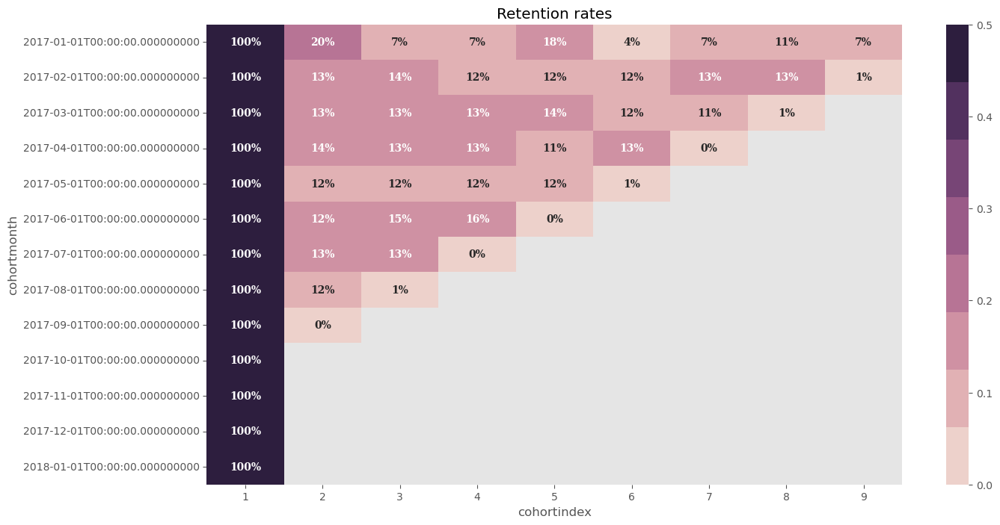

In [140]:
#this number means that 20% of the cohort which signed up in jan 2017, were active 2 months later. 
#100%  retention column means 1st month purchases
plt.figure(figsize=(15, 8))
plt.title('Retention rates')
sns.heatmap(data=retention, annot=True, fmt='.0%', vmin=0.0, vmax=0.5, cmap=sns.cubehelix_palette(8) ,
            annot_kws={'fontsize': 10,'fontweight': 'bold','fontfamily': 'serif'})
plt.show()

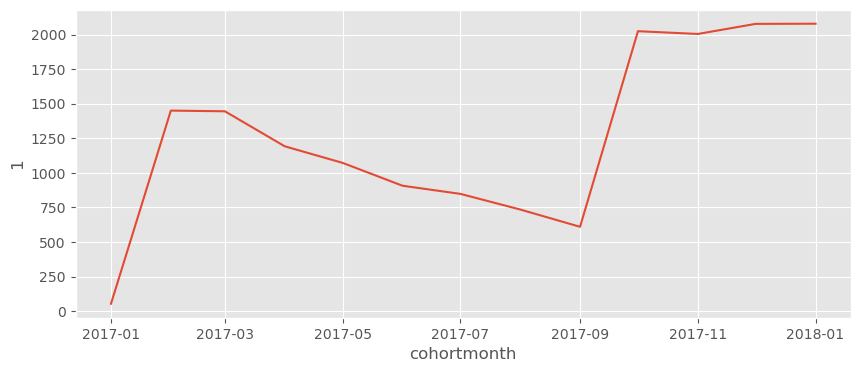

In [141]:
plt.figure(figsize=(10, 4))
sns.lineplot(data=first_pivot[1]);

# 
Customer retention is a very useful metric to understand how many of the all customers are still active. Retention gives you the percentage of active customers compared to the total number of customers.

# 2nd Cohort: Average Quantity Sold

In [142]:
second_cohort = cohort_df.groupby(['cohortmonth', 'cohortindex'])['Order_Quantity'].mean().reset_index()
second_cohort.head()

,cohortmonth,cohortindex,Order_Quantity
0,2017-01-01,1,2.185629
1,2017-01-01,2,2.692308
2,2017-01-01,3,2.285714
3,2017-01-01,4,3.125000
4,2017-01-01,5,1.914286


In [143]:
second_pivot = second_cohort.pivot(index='cohortmonth', columns='cohortindex', values='Order_Quantity').round(1)
second_pivot
#cmap='RdPu'
#cmap='coolwarm'
#sns.heatmap(data=second_pivot, annot=True, cmap="Blues", fmt='g', linewidths = 2 , linecolor = "black");

cohortindex,1,2,3,4,5,6,7,8,9
cohortmonth,,,,,,,,,
2017-01-01,2.2,2.7,2.3,3.1,1.9,2.2,2.5,2.7,1.7
2017-02-01,2.3,2.0,2.1,2.0,2.1,2.1,2.1,2.0,1.8
2017-03-01,2.2,2.1,2.1,2.1,2.1,2.0,2.0,1.9,NaN
2017-04-01,2.2,2.0,2.0,2.1,2.1,1.9,2.4,NaN,NaN
2017-05-01,2.1,2.2,2.1,2.0,2.0,2.4,NaN,NaN,NaN
2017-06-01,2.0,2.0,2.2,2.0,1.7,NaN,NaN,NaN,NaN
2017-07-01,2.1,2.1,2.2,2.1,NaN,NaN,NaN,NaN,NaN
2017-08-01,2.1,2.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01,2.0,2.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN


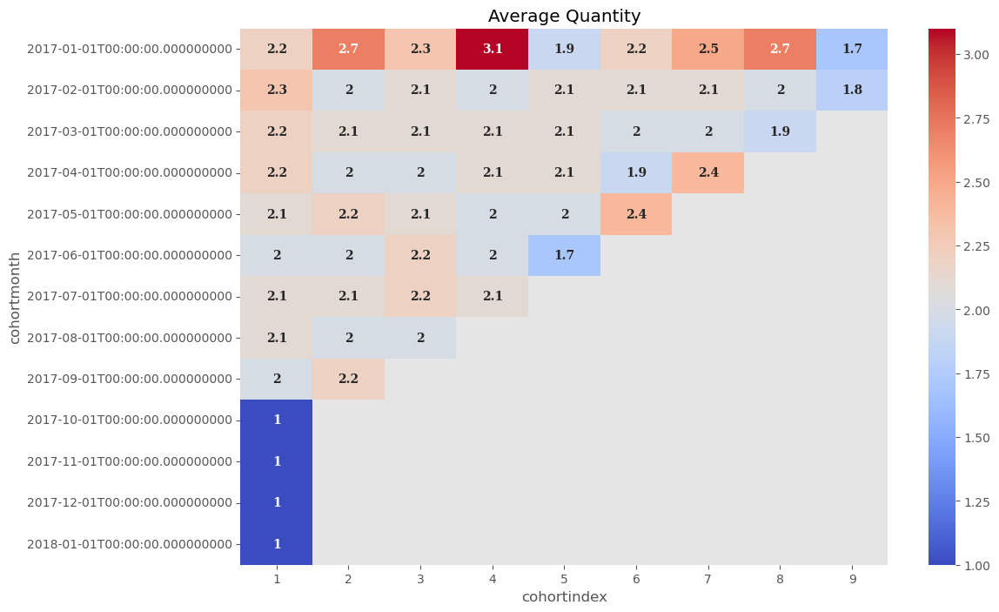

In [144]:
plt.figure(figsize=(12, 8))
plt.title('Average Quantity')
sns.heatmap(data=second_pivot, annot=True, cmap="coolwarm", fmt='g' ,annot_kws={'fontsize': 10,'fontweight': 'bold','fontfamily': 'serif'});

# 3rd Cohort: Average Sales

In [145]:
third_cohort = cohort_df.groupby(['cohortmonth', 'cohortindex'])['Total_price'].mean().reset_index()
third_cohort.head()

,cohortmonth,cohortindex,Total_price
0,2017-01-01,1,176.550002
1,2017-01-01,2,198.551028
2,2017-01-01,3,185.315716
3,2017-01-01,4,248.494998
4,2017-01-01,5,172.387145


In [146]:
third_pivot = third_cohort.pivot(index='cohortmonth', columns='cohortindex', values='Total_price').round(2)
third_pivot

cohortindex,1,2,3,4,5,6,7,8,9
cohortmonth,,,,,,,,,
2017-01-01,176.55,198.55,185.32,248.49,172.39,224.33,269.07,165.27,167.19
2017-02-01,182.05,171.42,176.54,185.95,188.98,186.39,183.32,194.54,413.22
2017-03-01,176.87,182.42,185.73,189.03,193.78,188.78,209.82,285.47,NaN
2017-04-01,178.90,189.05,186.72,180.99,185.14,195.92,214.36,NaN,NaN
2017-05-01,186.73,190.17,189.92,185.12,200.65,291.10,NaN,NaN,NaN
2017-06-01,186.28,194.30,188.98,190.41,466.71,NaN,NaN,NaN,NaN
2017-07-01,183.42,186.28,195.45,290.97,NaN,NaN,NaN,NaN,NaN
2017-08-01,189.65,207.05,163.34,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01,197.46,279.97,NaN,NaN,NaN,NaN,NaN,NaN,NaN


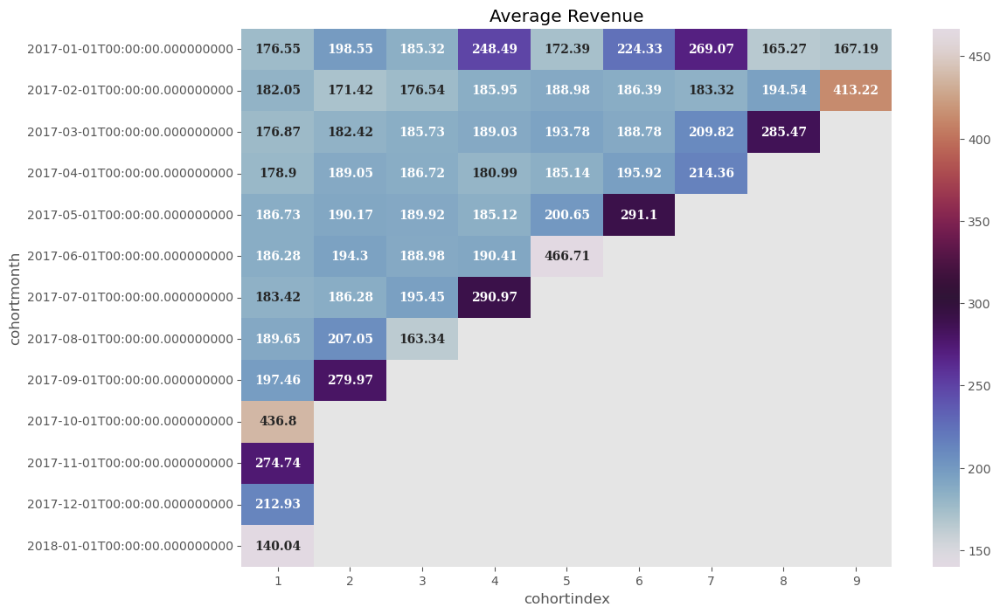

In [147]:
plt.figure(figsize=(12, 8))
plt.title('Average Revenue')
sns.heatmap(data=third_pivot, annot=True, cmap='twilight', fmt='g' , annot_kws={'fontsize': 10,'fontweight': 'bold','fontfamily': 'serif'});
#sns.heatmap(data=second_pivot, annot=True, cmap='Greens', fmt='g');

#
In this project, three different types of analyses were applied independently, including RFM Segmentation, K-Means Clustering and Cohort Analysis. All three analysis methods offer some specific advantages and also have limitations. In this project, we were able to see in which area and to what extent we should use these methods.

First, RFM Customer Segmentation was performed, which is the technique of diving customers into groups based on their purchase patterns to identify who are the most profitable groups. In segmenting customers, various criteria can also be used depending on the market such as geographic, demographic characteristics or behavior bases. This technique assumes that groups with different features require different approaches to marketing and wants to figure out the groups who can boost their profitability the most. In this sense, the customers in our dataset were divided into insightful clusters. What makes RFM analysis attractive is the flexibility it offers so the segmentation could be specified in terms of business needs and an analyist could create customer groups based on their purchase history – how recently, with what Frequency, and what value they bought. On the other hand, it is susceptible to user-induced biases.

Second, K-Means clustering as an unsupervised machine learning algorithm was applied to determine underlying clusters. Since the dataset in the given study did NOT provide a significant tendency to cluster when compared to user defined segmentations in RFM modelling, K-Means clustering could NOT produce a satisfactory and insightful clustering.

Finally, Cohort Analysis is used to gain new insights from the data related to time-based cohorts and is a kind of behavioral analytics that breaks the data in a data set into related groups before analysis. These groups, or cohorts, usually share common characteristics or experiences within a defined time-span. Cohort analysis allows the analysist to ask more specific, targeted questions and make informed product decisions that will reduce churn and drastically increase revenue. You could also call it customer churn analysis. Therefore, the strength of cohort analysis is its elasticity since it provides specific analysis based on business needs. As such, business owners can develop effective strategies and marketing campaigns to retent their customers, prevent churn rate.


# clv

#
What is Customer Lifetime Value(CLV or CLTV)?¶
Customer lifetime value is how much money a customer will bring your brand throughout their entire time as a paying customer.It is the monetary value that a customer will give to a company during its relationship-communication with a company.

In fact, it is to be able to extract the future situation from the current situation of the customer.

For this we will first make a simple calculation and then we will add the time factor.

# 
This time we divided people into A, B, C segments. (Not to be confused with rfm segmentation.) Let's remember we do life-time value calculations.

The calculations in the table have been made.

Standardization process was done for better understanding.

In [148]:
datamart

,Recency,Frequency,MonetaryValue,R,F,RFM_Segment,RFM_Score,General_Segment,ClusterID,K-Means Predicted Cluster
CustomerID,,,,,,,,,,
2,137,2,1026.720024,2,4,2.04.0,6,VIP,1,Current Custemer
3,230,3,2563.380028,1,4,1.04.0,5,Royal,1,Current Custemer
7,221,2,1604.390022,1,4,1.04.0,5,Royal,1,Current Custemer
8,127,3,800.730011,2,4,2.04.0,6,VIP,1,Current Custemer
9,141,3,1852.870033,2,4,2.04.0,6,VIP,1,Current Custemer
...,...,...,...,...,...,...,...,...,...,...
20753,1,1,161.869995,4,4,4.04.0,8,VIP,0,Churned/Needed Attention Customers
20754,1,1,172.660004,4,4,4.04.0,8,VIP,0,Churned/Needed Attention Customers
20755,1,1,314.640015,4,4,4.04.0,8,VIP,0,Churned/Needed Attention Customers


In [149]:
"""#CUSTOMERSEGMENTATIONINPYTHONAssignacquisitionmonthcohort
def get_month(x): return dt.datetime(x.year, x.month, 1)
df['InvoiceMonth'] = df['order date (DateOrders)'].apply(get_month)
grouping = df.groupby('Customer Id')['InvoiceMonth']
df['CohortMonth'] = grouping.transform('min')
df.sample(10)"""

'''def get_date_int(df, column):
    year = df[column].dt.year
    month = df[column].dt.month
    day = df[column].dt.day
    return year, month, day
'''



"""invoice_year, invoice_month, _= get_date_int(df,'InvoiceMonth')
cohort_year, cohort_month, _= get_date_int(df,'CohortMonth')
years_diff = invoice_year - cohort_year
months_diff = invoice_month - cohort_month
df['CohortIndex'] = years_diff * 12 + months_diff + 1
df.head()"""


"invoice_year, invoice_month, _= get_date_int(df,'InvoiceMonth')\ncohort_year, cohort_month, _= get_date_int(df,'CohortMonth')\nyears_diff = invoice_year - cohort_year\nmonths_diff = invoice_month - cohort_month\ndf['CohortIndex'] = years_diff * 12 + months_diff + 1\ndf.head()"

In [150]:
"""# 11 customer of 54 back in the second month 
grouping = df.groupby(['CohortMonth','CohortIndex'])
cohort_data = grouping['Customer Id'].apply(pd.Series.nunique)
cohort_data = cohort_data.reset_index()
cohort_counts = cohort_data.pivot(index='CohortMonth',columns='CohortIndex',values='Customer Id')
print(cohort_counts)"""




"""cohort_sizes = cohort_counts.iloc[:,0]
retention = cohort_counts.divide(cohort_sizes, axis=0)
retention.round(3) * 100"""

'cohort_sizes = cohort_counts.iloc[:,0]\nretention = cohort_counts.divide(cohort_sizes, axis=0)\nretention.round(3) * 100'

In [151]:
"""# avg quantity that purchased in the nxt month 
grouping = df.groupby(['CohortMonth','CohortIndex'])
cohort_data = grouping['Order Item Quantity'].mean()
cohort_data = cohort_data.reset_index()
average_quantity = cohort_data.pivot(index='CohortMonth',columns='CohortIndex',values='Order Item Quantity')
average_quantity.round(1)
"""


"""plt.figure(figsize=(12, 8))
plt.title('Average Quantity')
sns.heatmap(data=average_quantity, annot=True, cmap='Oranges', fmt='g');
#sns.heatmap(data=second_pivot, annot=True, cmap='Greens', fmt


='g');
plt.show()"""

"plt.figure(figsize=(12, 8))\nplt.title('Average Quantity')\nsns.heatmap(data=average_quantity, annot=True, cmap='Oranges', fmt='g');\n#sns.heatmap(data=second_pivot, annot=True, cmap='Greens', fmt\n\n\n='g');\nplt.show()"

In [152]:
#datamart.to_csv('RFM_cleaned.csv', index=False)


In [153]:
#frequency_log= np.log(datamart['Frequency'])
#sns.distplot(frequency_log)
#plt.show()

In [154]:
#datamart_centered = datamart - datamart.mean()
#datamart_centered.describe()

In [155]:
'''# Unskew the data
datamart_log = np.log(datamart)

# Initialize a standard scaler and fit it
scaler = StandardScaler()
scaler.fit(datamart_log)

# Scale and center the data
datamart_normalized = scaler.transform(datamart_log)

# Create a pandas DataFrame
datamart_normalized = pd.DataFrame(data=datamart_normalized, index=datamart.index, columns=datamart.columns)'''

'# Unskew the data\ndatamart_log = np.log(datamart)\n\n# Initialize a standard scaler and fit it\nscaler = StandardScaler()\nscaler.fit(datamart_log)\n\n# Scale and center the data\ndatamart_normalized = scaler.transform(datamart_log)\n\n# Create a pandas DataFrame\ndatamart_normalized = pd.DataFrame(data=datamart_normalized, index=datamart.index, columns=datamart.columns)'

In [156]:
#datacamp
# Create a spend quartile with 4 groups - a range between 1 and 5
3#spend_quartile = pd.qcut(df['totalprice'], q=4, labels=range(1,5))

# Assign the quartile values to the Spend_Quartile column in data
#df['spend_quartiles'] = spend_quartile

# Print data with sorted Spend values ascending
#print(df.sort_values("totalprice"))

3

In [157]:
# Store labels from 4 to 1 in a decreasing order
#r_labels = list(range(4, 0, -1))

# Create a spend quartile with 4 groups and pass the previously created labels 
#recency_quartiles = pd.qcut(df['Recency_Days'], q=4, labels=r_labels)

# Assign the quartile values to the Recency_Quartile column in `data`
#df['Recency_Quartile'] = recency_quartiles 

# Print `data` with sorted Recency_Days values
#print(df.sort_values('Recency_Days'))